# Introduction

This project is completed by Chelyn Lee (U2523007F), Nina Smriti Donau (U2523536E), Muhammad Azmin Bin Abdul Razak (U2521326G), Law Yan Heng (U2521243L) and Liu Yanxi(U2520987J).

## Project overview

In this project, for each tutorial group in NTU's 'Introduction to Data Science' course, we aim to form 10 diverse groups consisting of 5 students each. This project will create diverse groups by taking into account the factors of gender, CGPA, and School.

## Problem decomposition process
1. Ranking of factors to consider (based on data analysis and problem statment requirements)
  - Tutorial group
  - GPA
  - Gender
  - School
2. Flowchart building (iterative approach)
  - Divide 50 students in each tutorial groups into 5 CGPAs bands (top 10, next 10, etc)
- Adding one student from each gpa band to form the group
- In the loop have constraint checks (gender and schools are to only have a certain amount depending on the tutorial group ratio)
3. Algorithm
- Output: saving file into final csv with sorted groups
  - New CSV file with the columns: `“Tutorial Group”`, `“Student ID”`, `“School”`, `“Name”`, `“Gender”`, `“CGPA”`, `“Team Assigned”`. The `“Team Assigned”` is the new column
4. Exception handling

## Flowchart
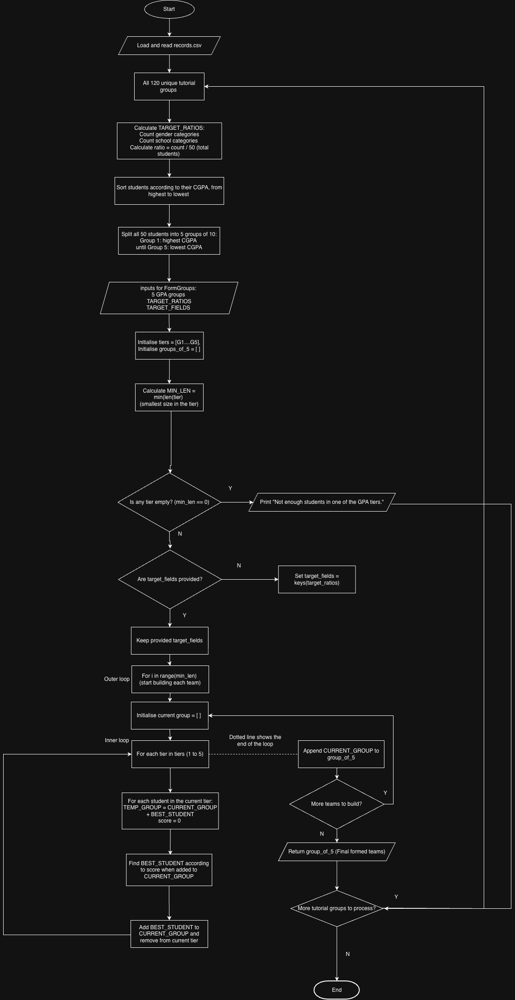

## Pseudocode

1. **Compute target ratios for the whole class**

  
       FUNCTION GetgroupRatios(all_rows, headers):
          Create an empty dictionary called RATIOS
          
          
          Total_students = number of all rows in all_rows
          IF Total_Students = 0:
               RETURN RATIOS // nothing to compute

          FOR EACH column name COL in Headers:
               Skip COL if it is "Tutorial Group", "Name", or "Student ID"

               // We only care about columns like Gender or School
               IF COL is "Gender" OR "COL" is "School":
                  Take all non-empty values from column COL across all_rows
                  Count how many of each catergory there are (e.g., Female vs Male; SBS vs NBS, etc.)


                  For each CATEGORY counted:
                      RATIO = (count for CATEGORY) / Total_Students
                      Save RATIO into RATIOS under RATIOS[COL][CATEGORY]
            
            RETURN RATIOS

2. **Split one tutorial group into 5 GPA Bands (Descending)**

        FUNCTION MakeGpaBands(tutorial_group_name, csv_file_path):
              Read the CSV to get HEADERS and ALL_DATA
              IF reading failed:
                  Return five empty lists

              STUDENTS = empty list

              FOR EACH row in ALL_DATA:
                  IF row's 'Tutorial Group" equals tutorial_group_name:
                    IF row has a valid number in "CGPA":
                         Convert CGPA to a number and keep the row
                         Add row to STUDENTS

              Sort STUDENTS from highest GPA to lowest GPA

              //Take them in blocks of 10
              BAND1 = students 1-10
              BAND2 = students 11-20
              BAND3 = students 21-30
              BAND4 = students 31-40
              BAND5 = students 41-50

              RETURN BAND1, BAND2, BAND3, BAND4, BAND5

3. **Form balanced 5-person teams (1 from each GPA band)**

       FUNCTION FormGroups(band1, band2, band3, band4, band5, TARGET_RATIOS, TARGET_FIELDS optional):
          TIERS = [band1, band2, band3, band4, band5]
          GROUPS = empty list

          // Check that every band has at least one student
          MIN_SIZE = the smallest size among the five bands
          IF MIN_SIZE = 0:
             SAY "Not enough students in one of the GPA tiers."
             RETURN empty list

          IF TARGET_FIELDS not given:
             TARGET_FIELDS = all the keys inside TARGET_RATIOS
             // usually ["Gender", "School"]

          // Helper idea: "How good is it to add this student to the current group?"
          DEFINE Score(candidate_student, current_group):
              TEMP_GROUP = current_group + candidate_student
              SCORE = 0

          FOR EACH FIELD in TARGET_FIELDS:
              Count how many of each CATEGORY appear in TEMP_GROUP for this FIELD
              TOTAL = number of people in TEMP_GROUP

            FOR EACH CATEGORY with a target ratio T in TARGET_RATIOS[FIELD]:
               CURRENT_RATIO = (how many in TEMP_GROUP have this CATEGORY) / TOTAL
               DIFFERENCE = absolute value of (CURRENT_RATIO - T)
               // smaller difference is better
               SCORE = SCORE - DIFFERENCE // subtract to penalise big gaps

          RETURN SCORE

        // Build groups one by one
        REPEAT MIN_SIZE times:
           CURRENT_GROUP = empty list

           FOR EACH TIER in TIERS (i.e., go through Band1 to Band5):
               IF TIER is empty:
                  CONTINUE to next TIER

               FROM TIER, find student that give the BEST Score when added to CURRENT_GROUP
               Add that student to CURRENT_GROUP
               Remove that student from TIER

          Add CURRENT_GROUP to GROUPS

        RETURN GROUPS

4. **Main Routine (run the whole process for every tutorial group)**

       MAIN:
          Read the CSV once to get HEADERS and ALL_DATA

          // Find all tutorial group names present
          TUTORIAL_GROUPS = empty set
          FOR EACH row in ALL_DATA:
            TG_NAME = row's "Tutorial Group" (trim spaces)
            IF TG_NAME is not empty:
              Add TG_NAME to TUTORIAL_GROUPS


          // Compute the overall target ratios (for the whole dataset)
          TARGET_RATIOS = GetGroupRatios(ALL_DATA, HEADERS)

          // For each tutorial group, split into bands and form balanced teams
          FOR EACH TG_NAME in TUTORIAL_GROUPS (sorted order):
             (B1,B2,B3,B4,B5) = MakeGpaBands(TG_NAME, csv_file_path)
             GROUPS_OF_5 = FormGroups(B1,B2,B3,B4,B5, TARGET_RATIOS)

          PRINT the teams for TG_NAME
          PRINT a blank line for readability

## Data Analysis

In [ ]:
# importing packages
import matplotlib.pyplot as plt
from collections import Counter

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# reading csv file
def csvReader(csv):
  try:
    with open(csv, "r") as file:
      content = file.read() # reading file as raw text
    lines = content.strip().split('\n')
    headers = lines[0].split(',')
    data = [line.split(',') for line in lines[1:]]
    # return as dictionary
    data_dict = [dict(zip(headers, row)) for row in data]
    return headers, data_dict
  except FileNotFoundError: # exception handling
    print(f"File '{csv}' not found.")
    return None, None


In [ ]:
filepath = '/content/drive/MyDrive/records.csv'

# reading csv file
headers, data = csvReader(filepath)
# printing out data
print(headers)
print(data)
print(type(data))

['Tutorial Group', 'Student ID', 'School', 'Name', 'Gender', 'CGPA']
[{'Tutorial Group': 'G-1', 'Student ID': '5002', 'School': 'CCDS', 'Name': 'Aarav Singh', 'Gender': 'Male', 'CGPA': '4.02'}, {'Tutorial Group': 'G-1', 'Student ID': '3838', 'School': 'EEE', 'Name': 'Aarti Nair', 'Gender': 'Female', 'CGPA': '4.05'}, {'Tutorial Group': 'G-1', 'Student ID': '2091', 'School': 'EEE', 'Name': 'Adlan Bin Rahman', 'Gender': 'Male', 'CGPA': '4.2'}, {'Tutorial Group': 'G-1', 'Student ID': '288', 'School': 'CoB (NBS)', 'Name': 'Ajay Verma', 'Gender': 'Male', 'CGPA': '4.01'}, {'Tutorial Group': 'G-1', 'Student ID': '4479', 'School': 'CCDS', 'Name': 'Amelia Kim', 'Gender': 'Female', 'CGPA': '4.11'}, {'Tutorial Group': 'G-1', 'Student ID': '5708', 'School': 'SoH', 'Name': 'Ananya Ramesh', 'Gender': 'Male', 'CGPA': '4.2'}, {'Tutorial Group': 'G-1', 'Student ID': '4563', 'School': 'WKW SCI', 'Name': 'Anjali Patel', 'Gender': 'Female', 'CGPA': '4.01'}, {'Tutorial Group': 'G-1', 'Student ID': '3989', '

In [ ]:
# getting the column data
def getting_coldata(col, group_rows):
  val = [(r[col]) for r in group_rows if r[col].strip()]
  if not val: # if no data is not in the tutorial group
      print(f"No {col} data available for this group.")
      return None
  return val

In [ ]:
def data_analysis(filepath):
    # Read all rows and headers
    headers, rows = csvReader(filepath)

    # Get all unique sorted tutorial groups
    tutorial_groups = sorted(
    set(row['Tutorial Group'] for row in rows),
    key=lambda x: int(''.join(filter(str.isdigit, x)))  # extract numeric part for easier sorting
)
    all_group_ratios = {}  # store ratios for all tutorial groups

    # Loop over groups
    for group in tutorial_groups:
        print(f"\n--- Tutorial Group: {group} ---")
        # Filter rows for this group
        group_rows = [r for r in rows if r['Tutorial Group'] == group]
        count = len(group_rows)

        print(f"Number of students in this group: {count}")

        fig, axes = plt.subplots(1, 3, figsize=(24, 8))

        group_ratios = {}  # store per-group ratios for scoring later

        for col in headers:
            if col in ('Tutorial Group', 'Name', "Student ID"):
                continue
            elif col == "CGPA":
              # collecting all the gpas for that tutorial group
              gpas = getting_coldata(col, group_rows)
              gpa_list = [float(x) for x in gpas] # making them into floats for easier comparison
              if gpa_list is None:
                continue

              # Plot histogram
              axes[0].hist(gpa_list, edgecolor='black')
              axes[0].set_title(f"CGPA Distribution - {group}")
              axes[0].set_xlabel("CGPA")
              axes[0].set_ylabel("Number of Students")

            elif col == "School":
              schools = getting_coldata(col, group_rows)
              if schools is None:
                continue

              school_counts = {school: schools.count(school) for school in set(schools)} # counting number of schools for plotting later into dict

              # plot bar chart
              axes[1].bar(school_counts.keys(), school_counts.values())
              axes[1].set_title(f"School Distribution - {group}")
              axes[1].set_xlabel("School")
              axes[1].set_ylabel("Number of Students")
              axes[1].tick_params(axis='x', labelsize=12, labelrotation=90)
              axes[1].tick_params(axis='y', labelsize=12)

            elif col == "Gender":
              # collecting all the genders for that tutorial group
              genders = getting_coldata(col, group_rows)
              if genders is None:
                continue

              gender_counts = {gender: genders.count(gender) for gender in set(genders)}

              def autopct_func(pct): # to display both percentages and count
                count_pct = int(round(pct * count / 100.0))
                return f'{pct:.1f}%\n({count_pct})'

              # plot pie chart
              axes[2].pie(gender_counts.values(), labels=gender_counts.keys(), autopct=autopct_func)
              axes[2].set_title(f"Gender Distribution - {group}")

        plt.subplots_adjust(hspace=0.4)
        plt.show()



--- Tutorial Group: G-1 ---
Number of students in this group: 50


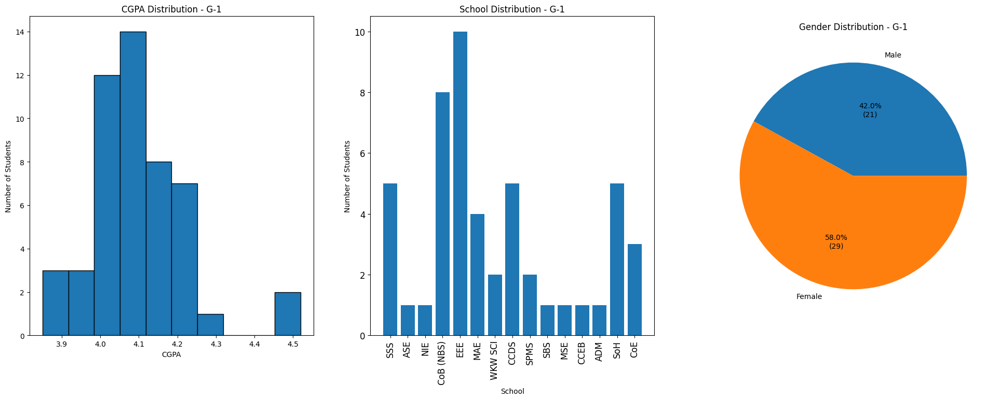


--- Tutorial Group: G-2 ---
Number of students in this group: 50


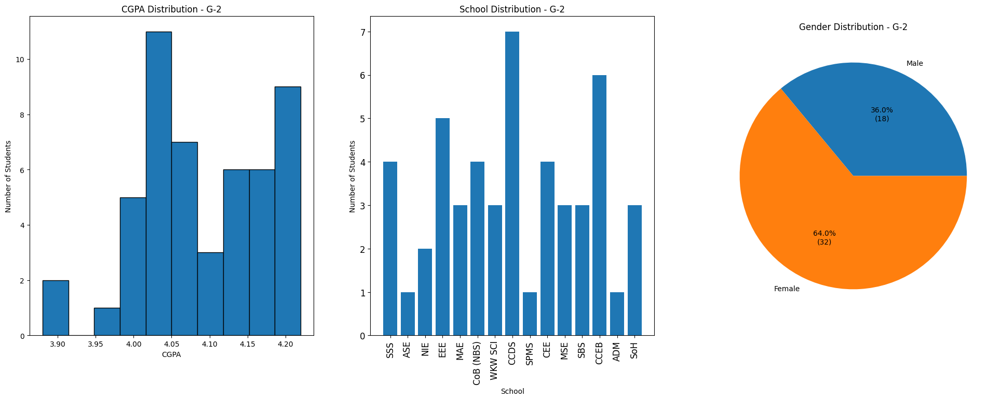


--- Tutorial Group: G-3 ---
Number of students in this group: 50


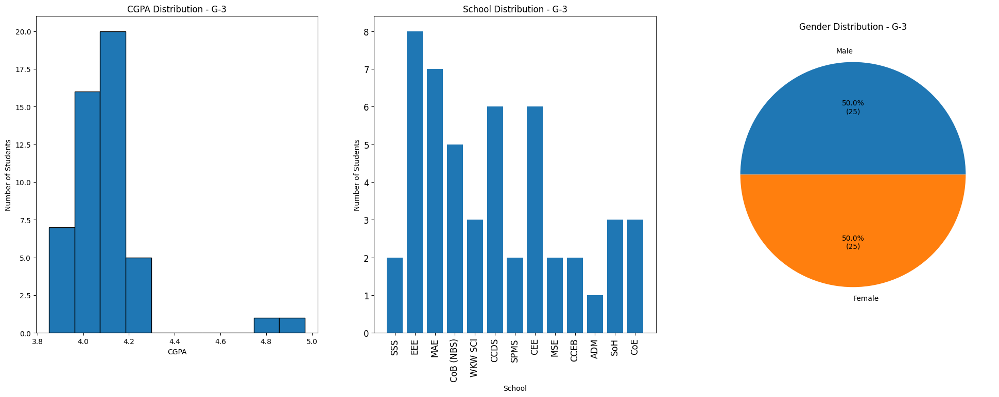


--- Tutorial Group: G-4 ---
Number of students in this group: 50


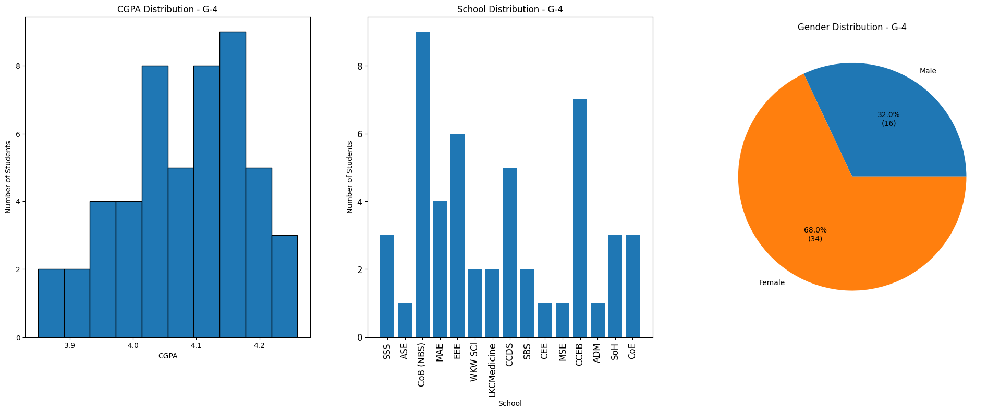


--- Tutorial Group: G-5 ---
Number of students in this group: 50


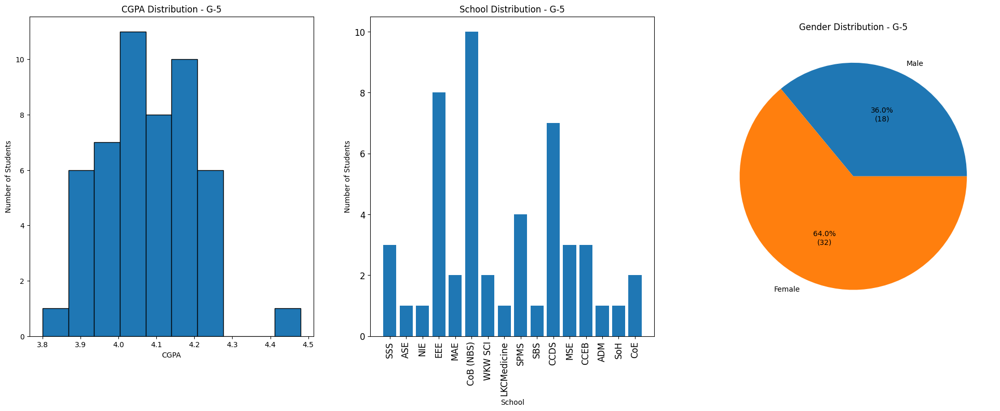


--- Tutorial Group: G-6 ---
Number of students in this group: 50


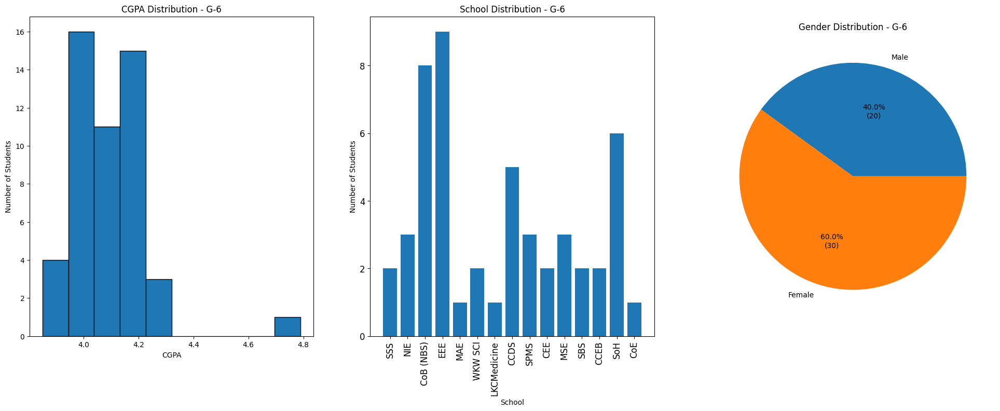


--- Tutorial Group: G-7 ---
Number of students in this group: 50


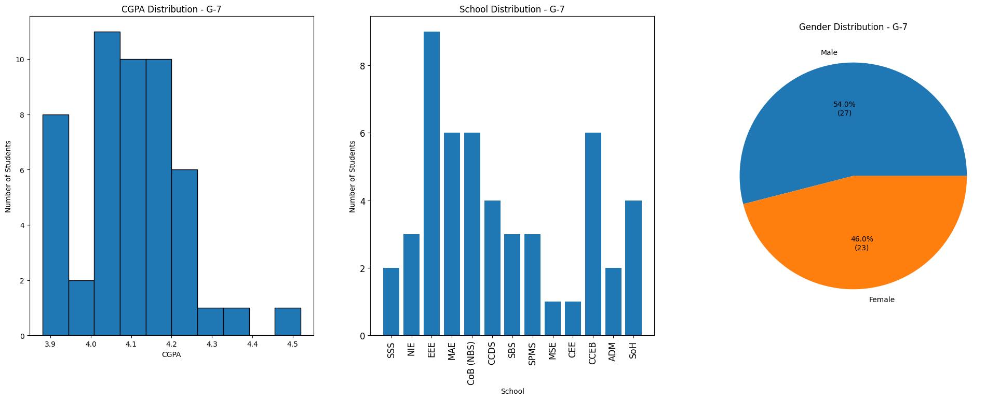


--- Tutorial Group: G-8 ---
Number of students in this group: 50


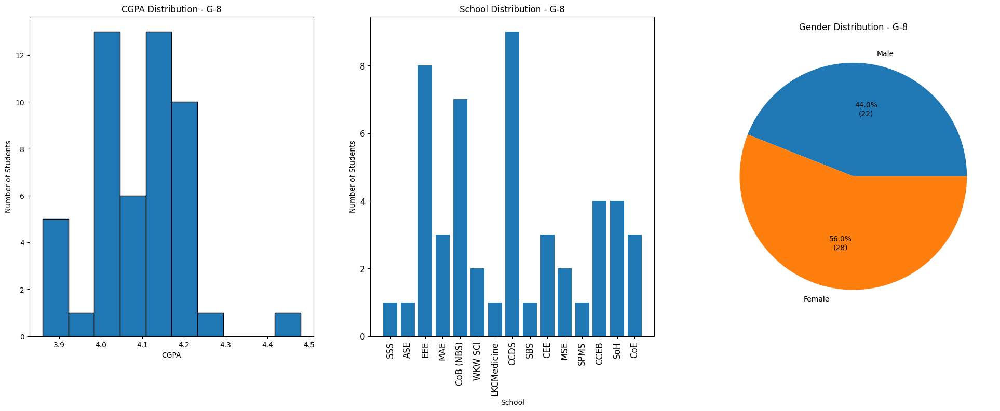


--- Tutorial Group: G-9 ---
Number of students in this group: 50


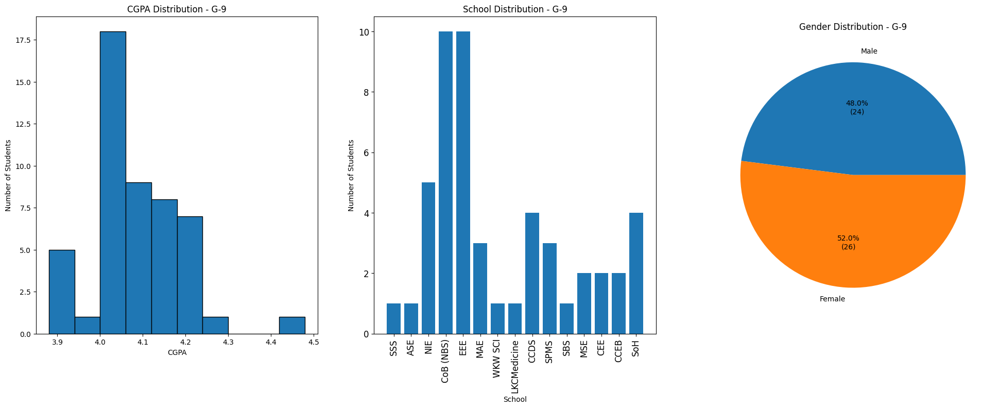


--- Tutorial Group: G-10 ---
Number of students in this group: 50


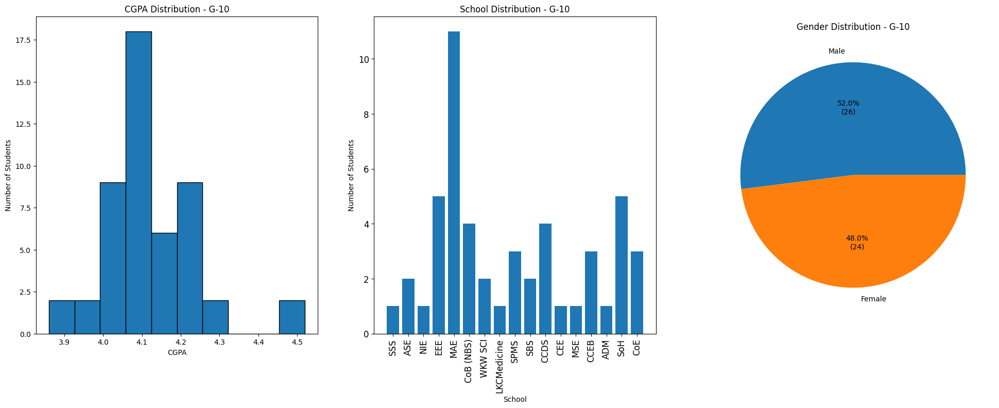


--- Tutorial Group: G-11 ---
Number of students in this group: 50


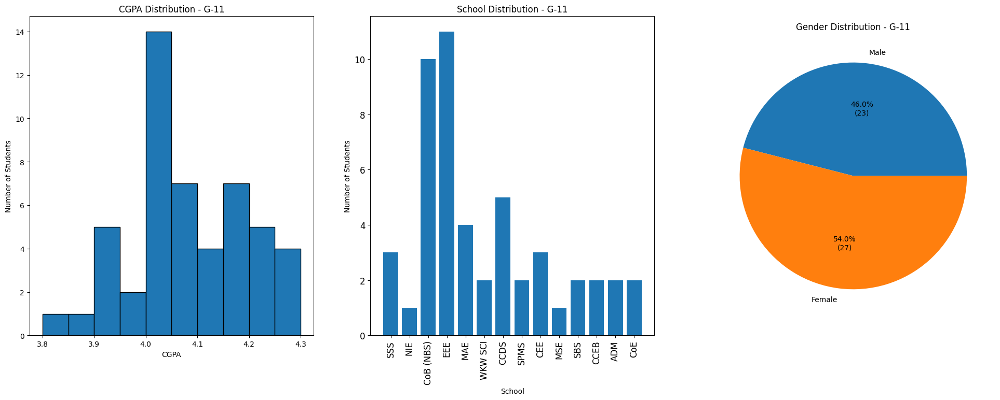


--- Tutorial Group: G-12 ---
Number of students in this group: 50


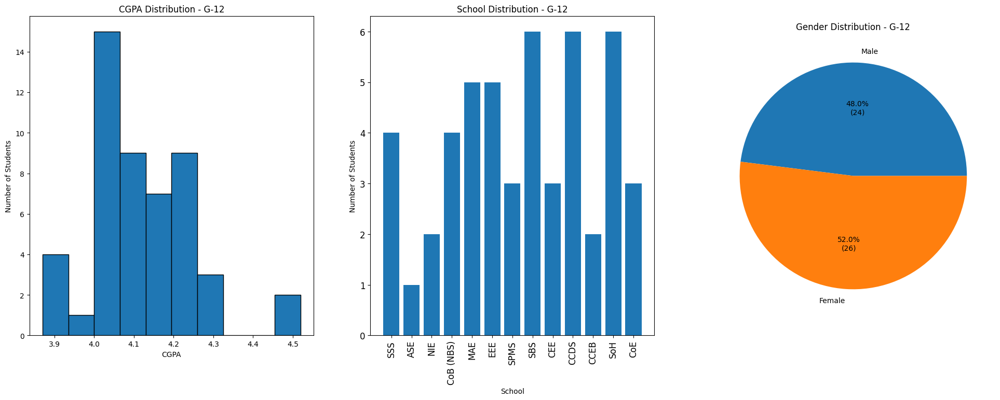


--- Tutorial Group: G-13 ---
Number of students in this group: 50


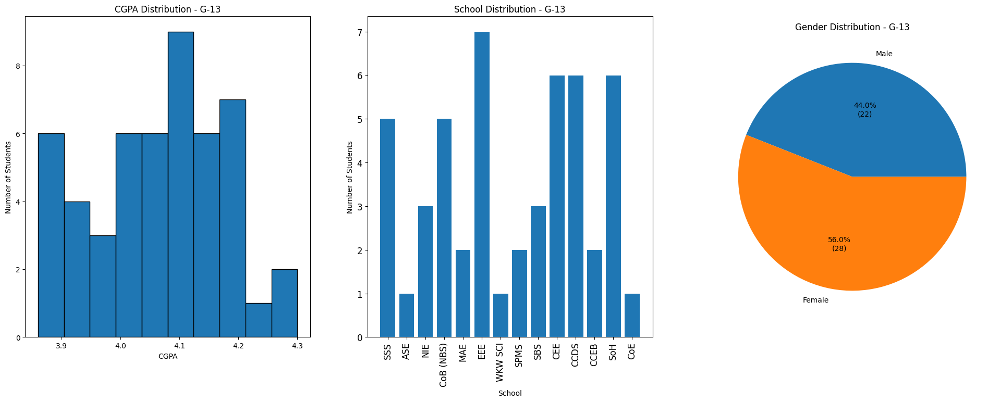


--- Tutorial Group: G-14 ---
Number of students in this group: 50


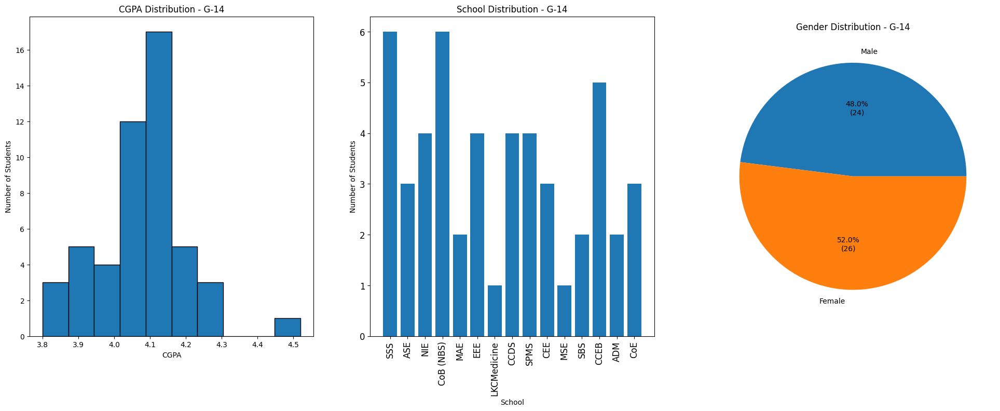


--- Tutorial Group: G-15 ---
Number of students in this group: 50


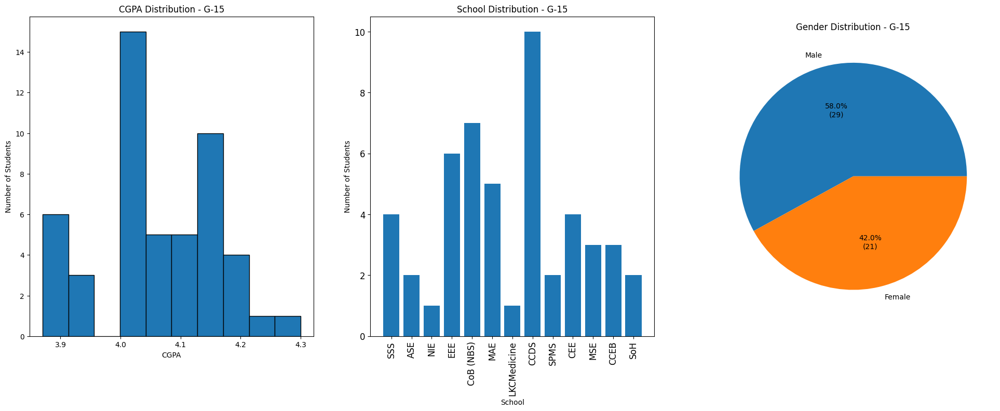


--- Tutorial Group: G-16 ---
Number of students in this group: 50


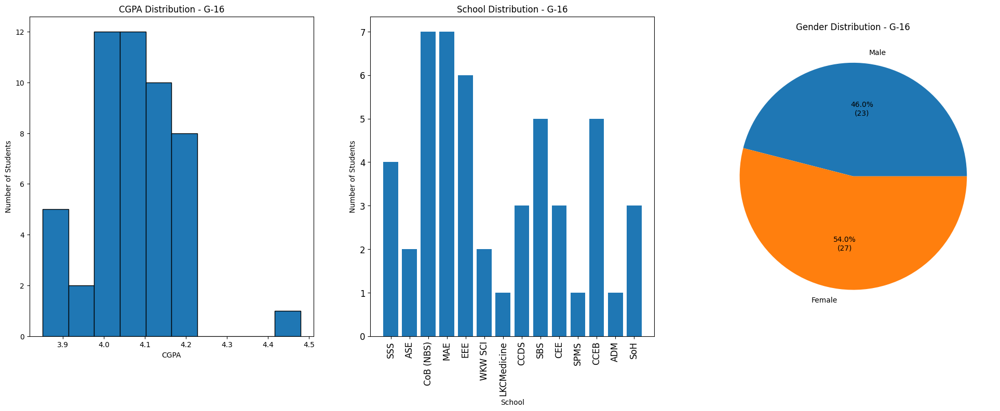


--- Tutorial Group: G-17 ---
Number of students in this group: 50


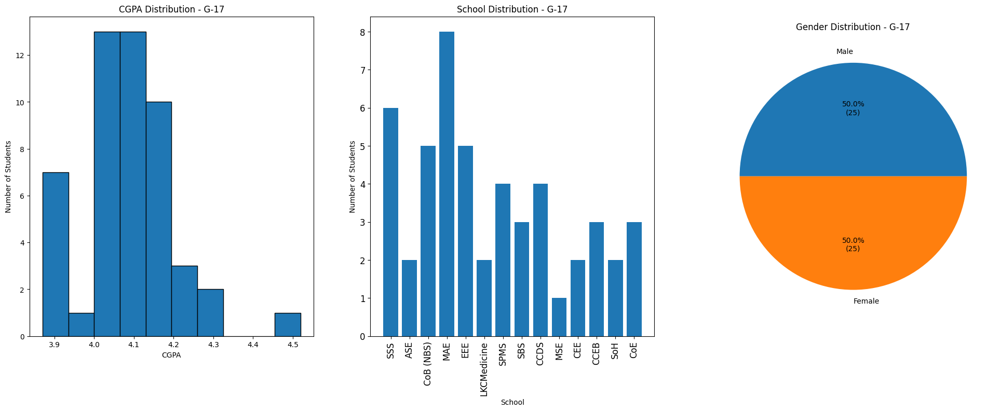


--- Tutorial Group: G-18 ---
Number of students in this group: 50


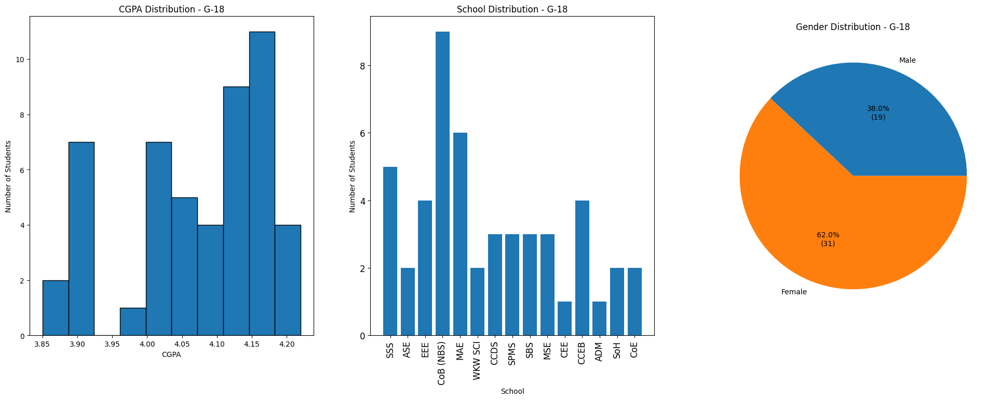


--- Tutorial Group: G-19 ---
Number of students in this group: 50


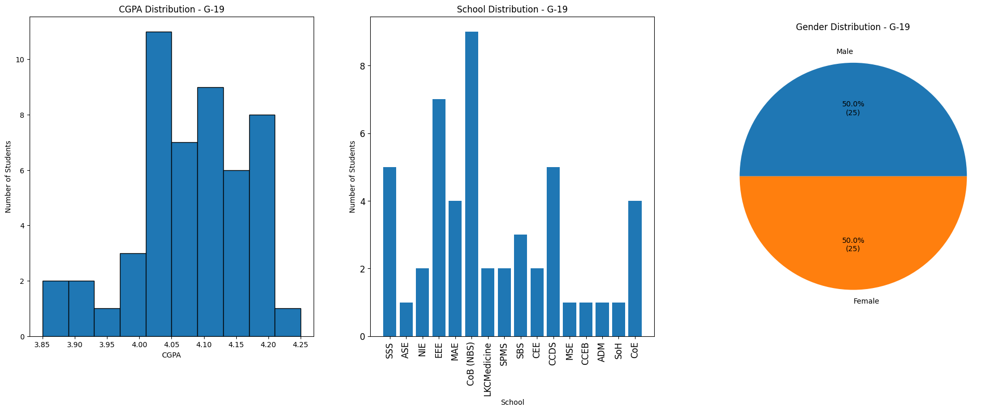


--- Tutorial Group: G-20 ---
Number of students in this group: 50


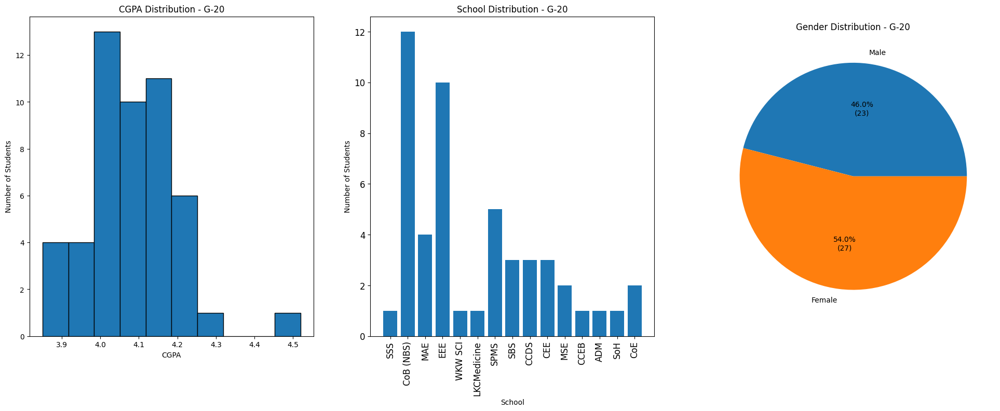


--- Tutorial Group: G-21 ---
Number of students in this group: 50


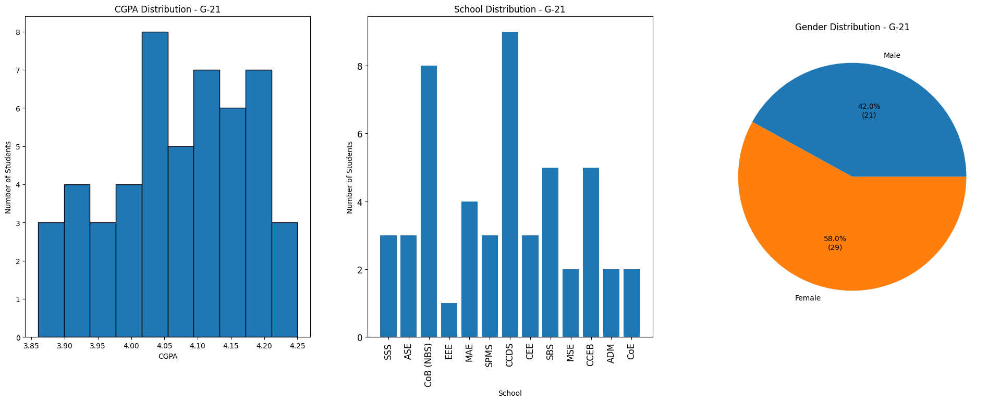


--- Tutorial Group: G-22 ---
Number of students in this group: 50


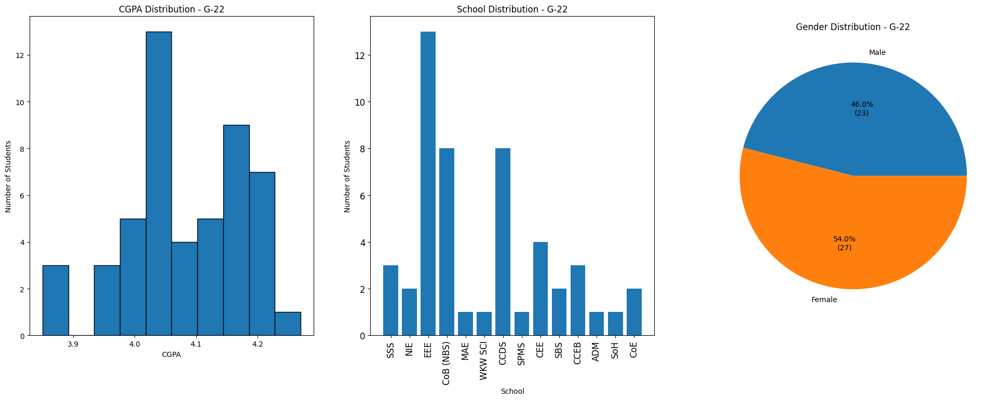


--- Tutorial Group: G-23 ---
Number of students in this group: 50


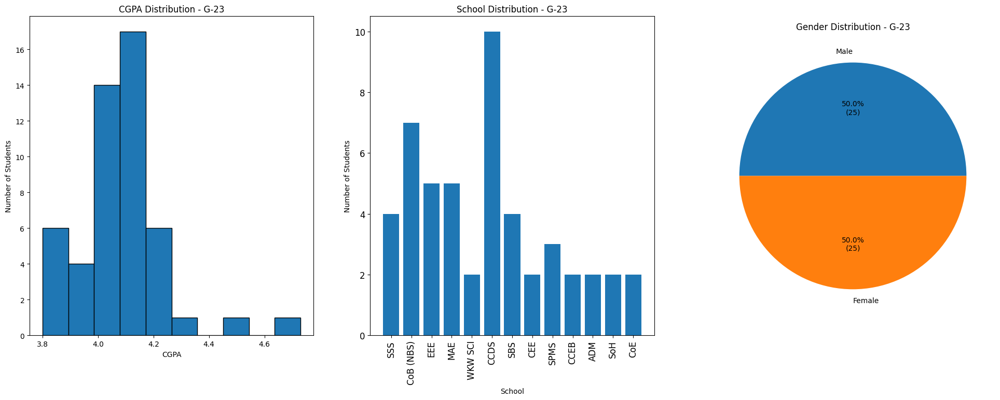


--- Tutorial Group: G-24 ---
Number of students in this group: 50


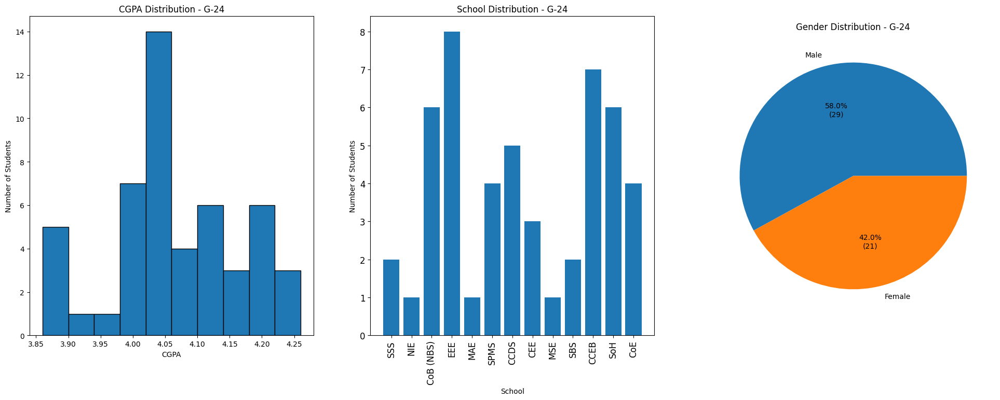


--- Tutorial Group: G-25 ---
Number of students in this group: 50


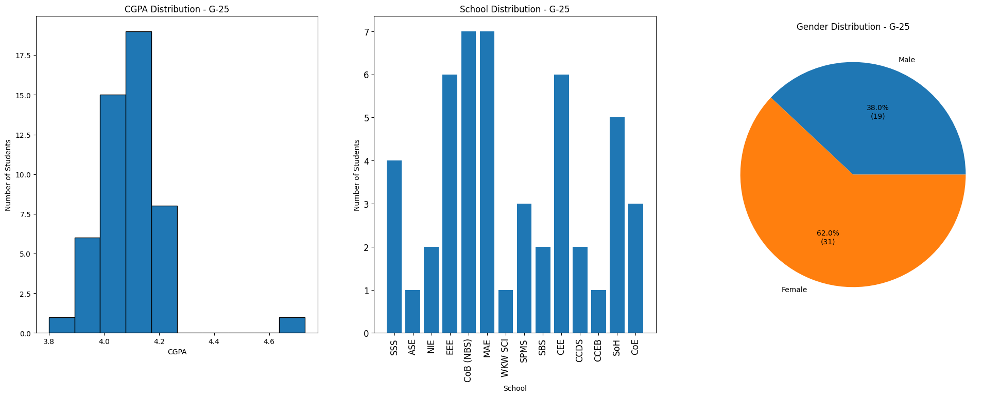


--- Tutorial Group: G-26 ---
Number of students in this group: 50


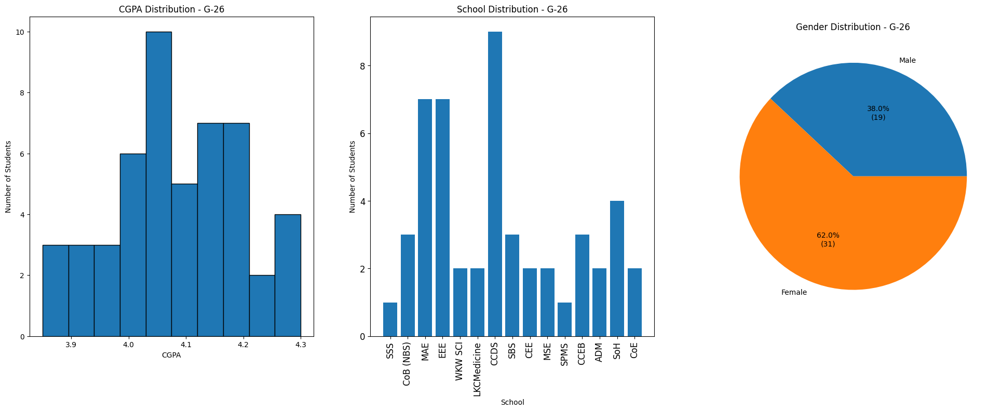


--- Tutorial Group: G-27 ---
Number of students in this group: 50


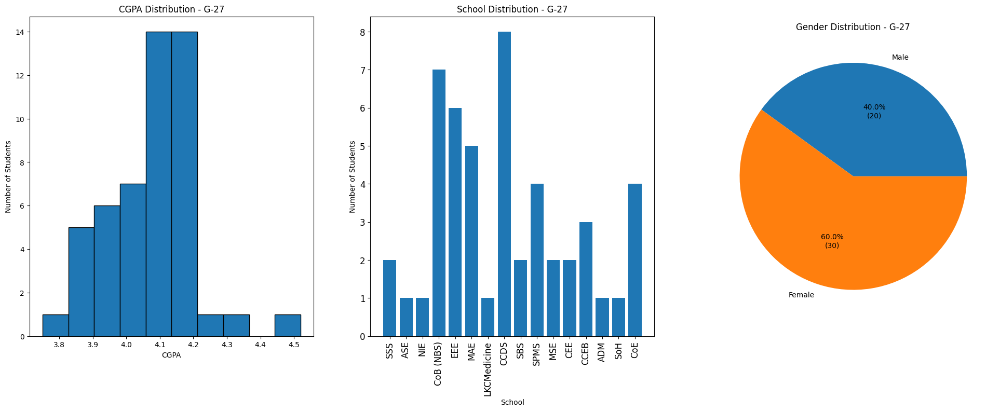


--- Tutorial Group: G-28 ---
Number of students in this group: 50


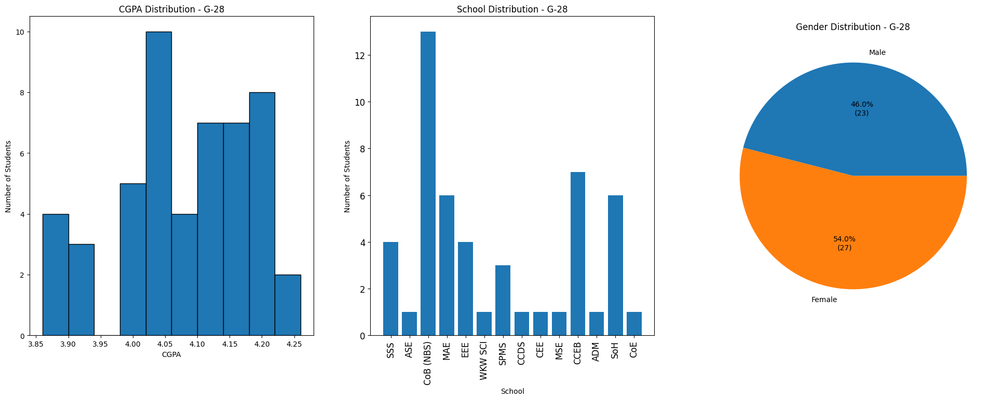


--- Tutorial Group: G-29 ---
Number of students in this group: 50


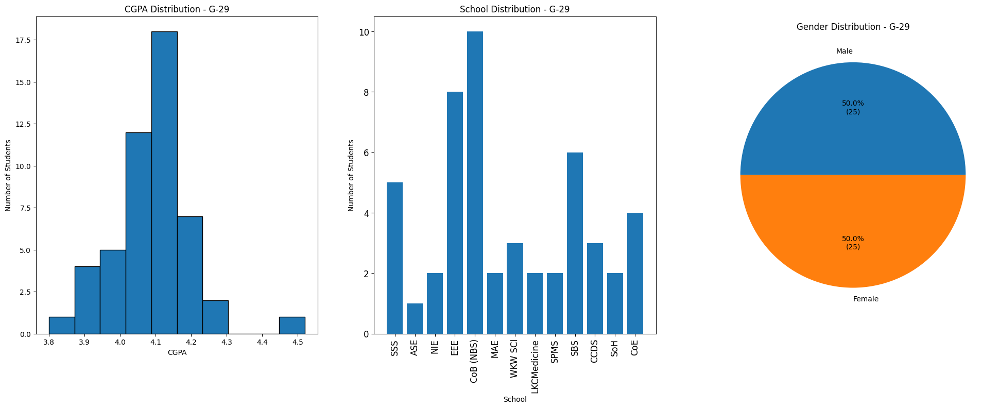


--- Tutorial Group: G-30 ---
Number of students in this group: 50


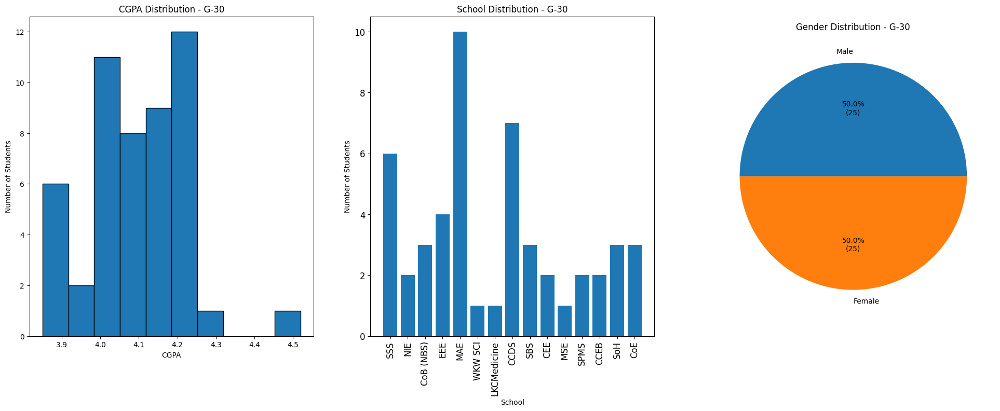


--- Tutorial Group: G-31 ---
Number of students in this group: 50


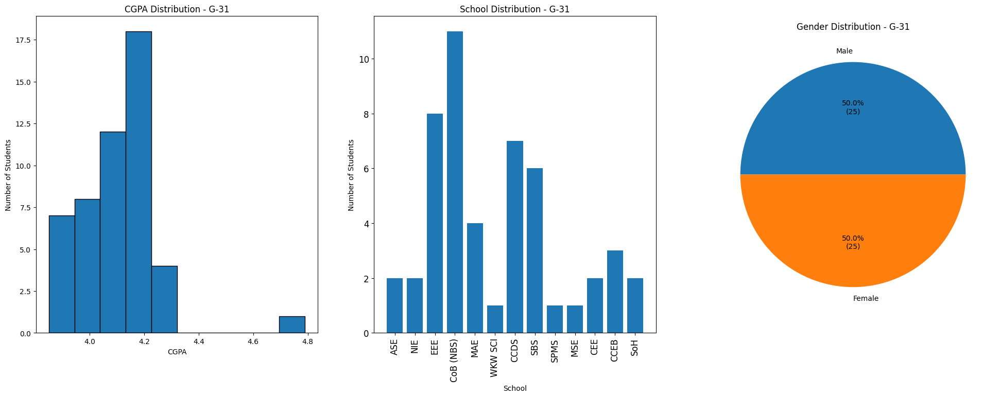


--- Tutorial Group: G-32 ---
Number of students in this group: 50


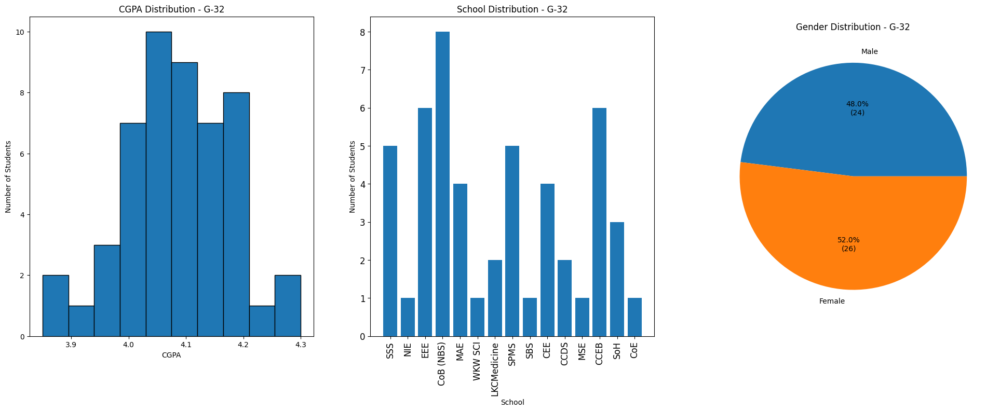


--- Tutorial Group: G-33 ---
Number of students in this group: 50


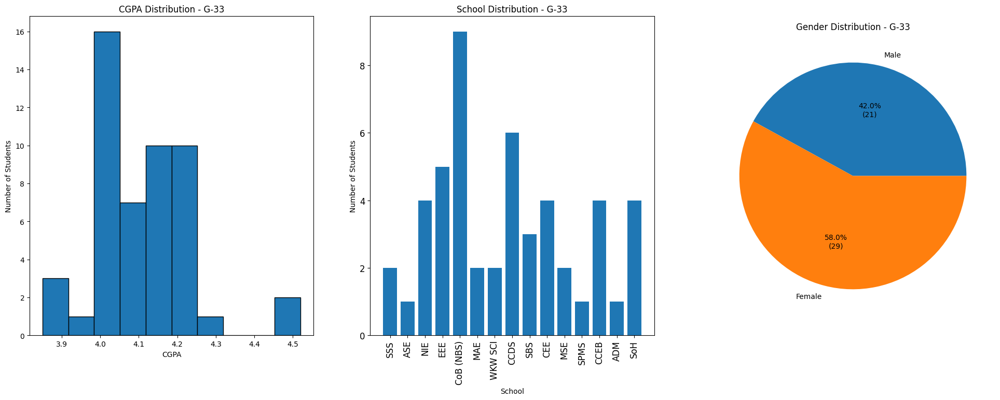


--- Tutorial Group: G-34 ---
Number of students in this group: 50


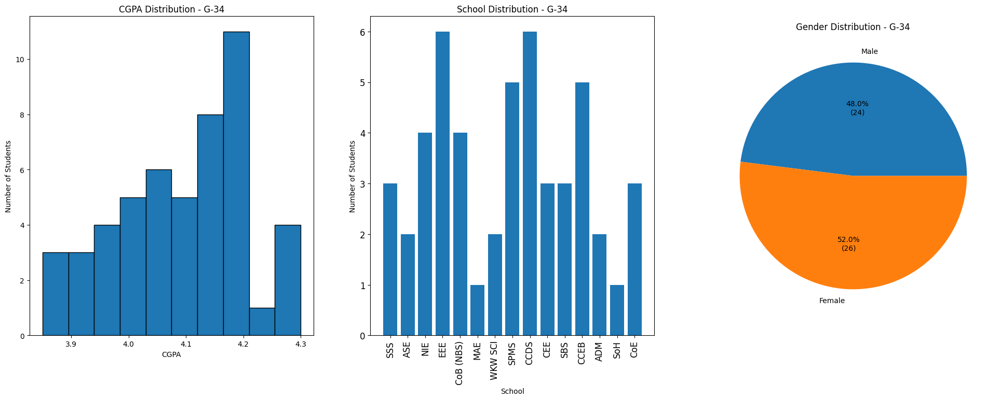


--- Tutorial Group: G-35 ---
Number of students in this group: 50


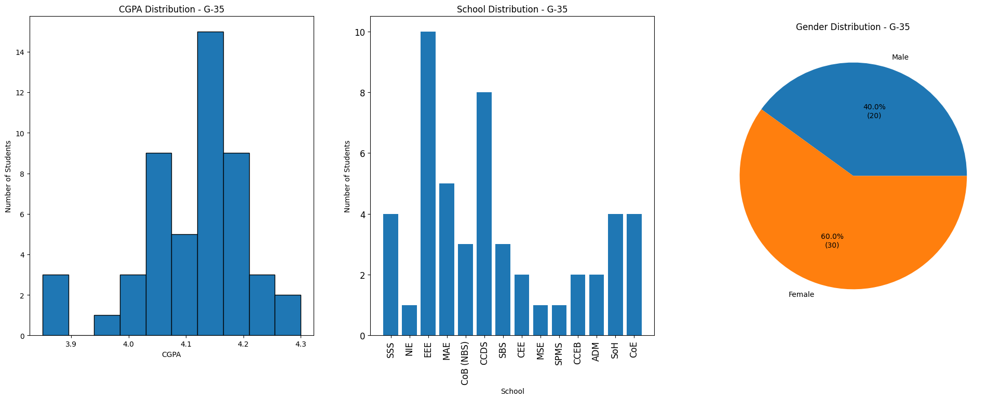


--- Tutorial Group: G-36 ---
Number of students in this group: 50


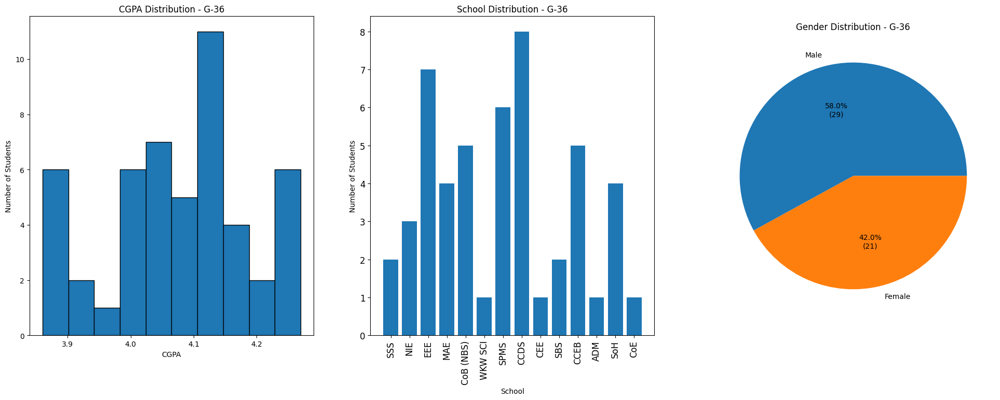


--- Tutorial Group: G-37 ---
Number of students in this group: 50


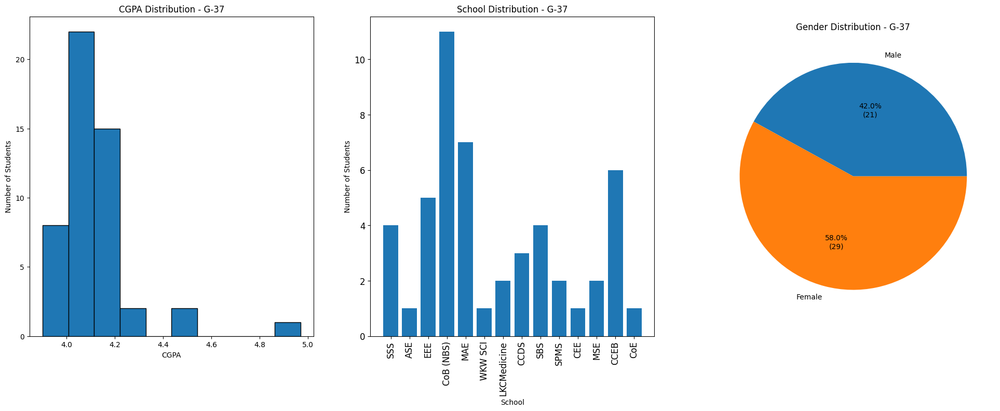


--- Tutorial Group: G-38 ---
Number of students in this group: 50


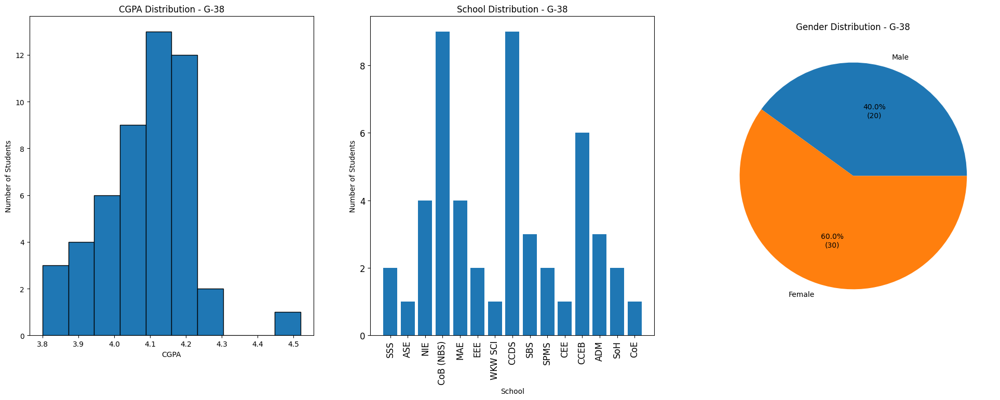


--- Tutorial Group: G-39 ---
Number of students in this group: 50


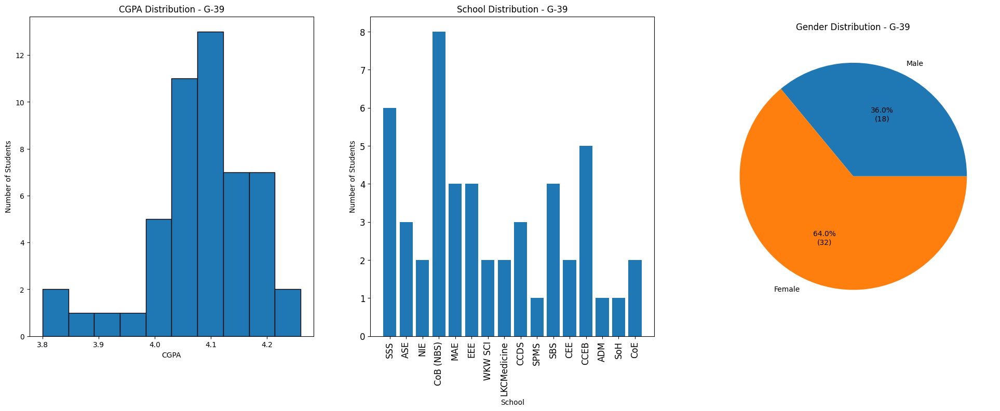


--- Tutorial Group: G-40 ---
Number of students in this group: 50


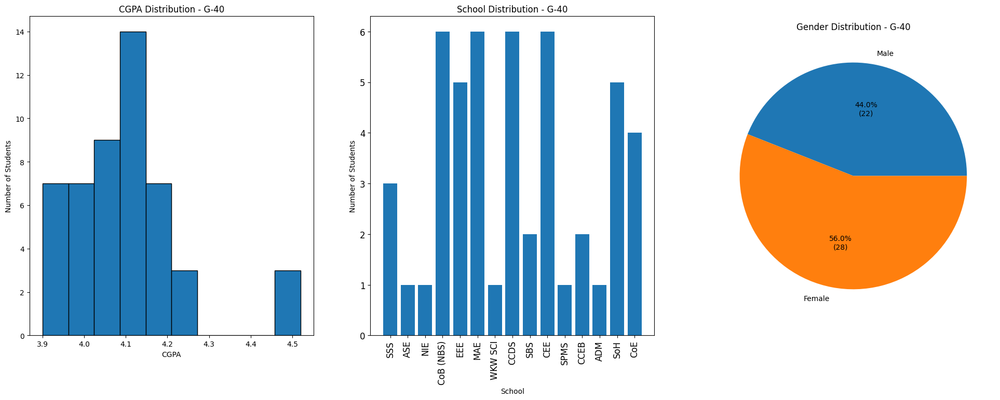


--- Tutorial Group: G-41 ---
Number of students in this group: 50


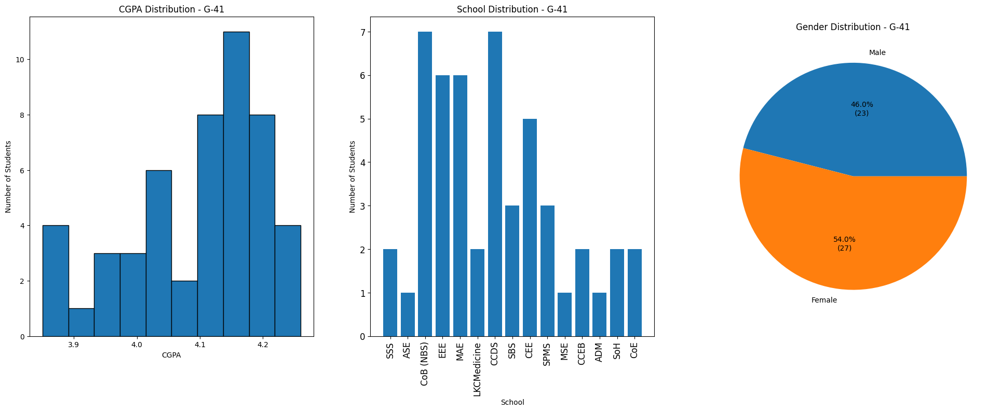


--- Tutorial Group: G-42 ---
Number of students in this group: 50


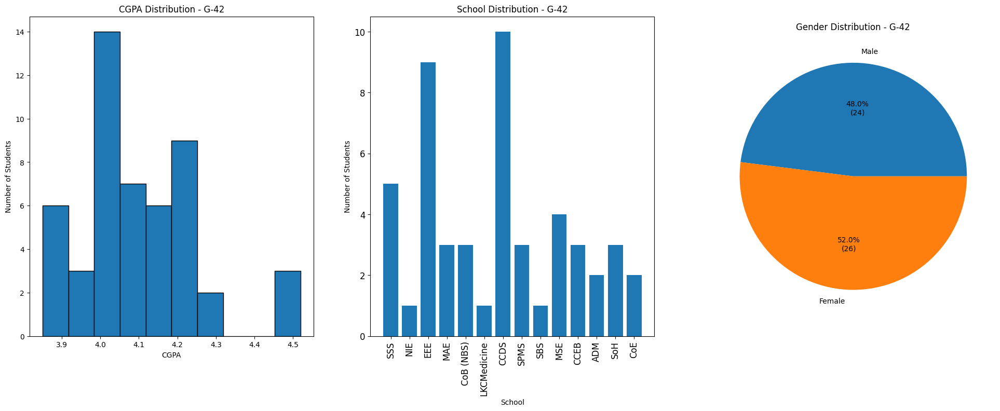


--- Tutorial Group: G-43 ---
Number of students in this group: 50


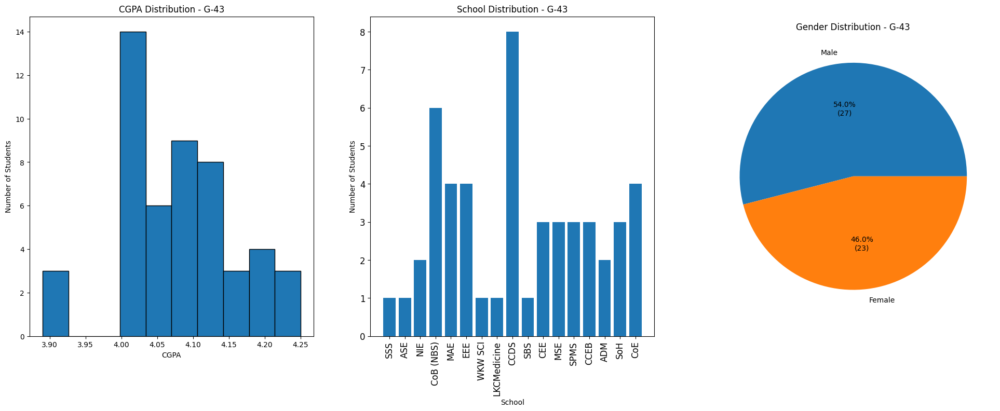


--- Tutorial Group: G-44 ---
Number of students in this group: 50


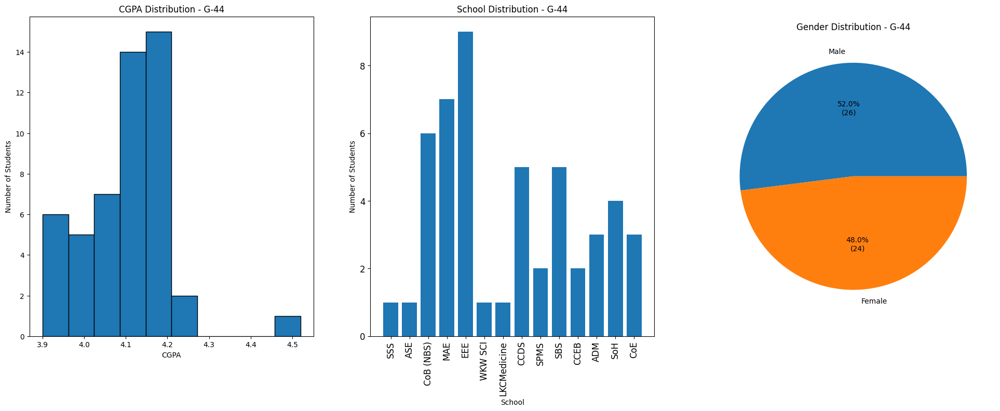


--- Tutorial Group: G-45 ---
Number of students in this group: 50


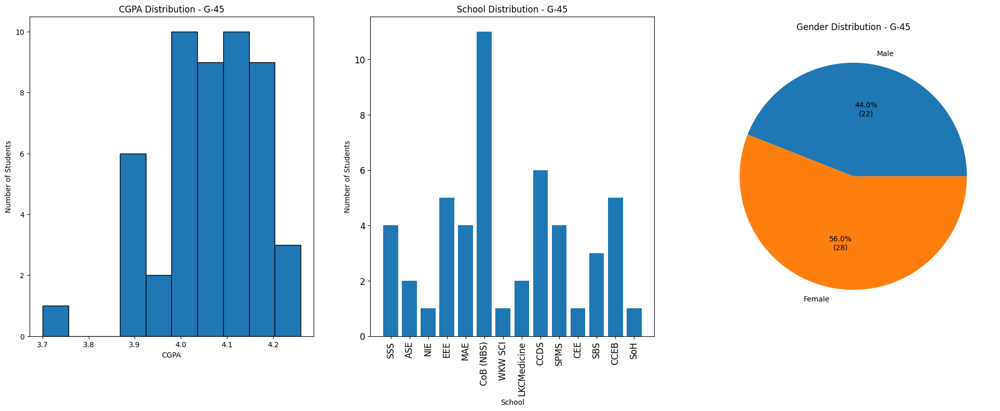


--- Tutorial Group: G-46 ---
Number of students in this group: 50


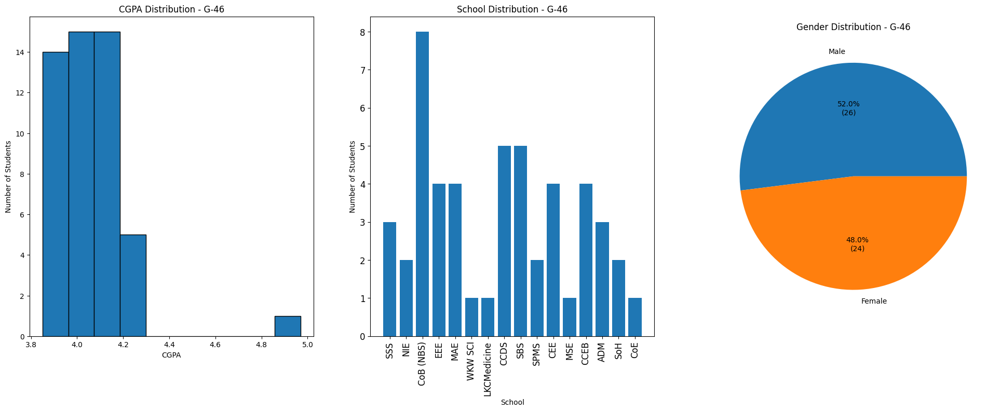


--- Tutorial Group: G-47 ---
Number of students in this group: 50


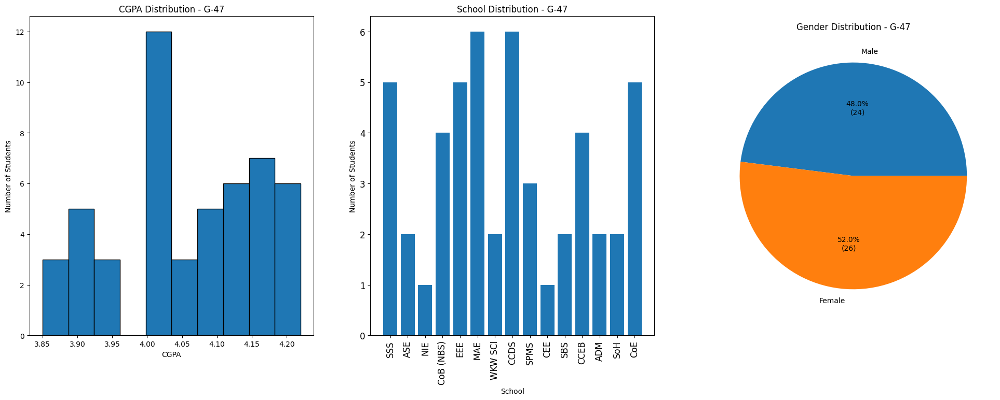


--- Tutorial Group: G-48 ---
Number of students in this group: 50


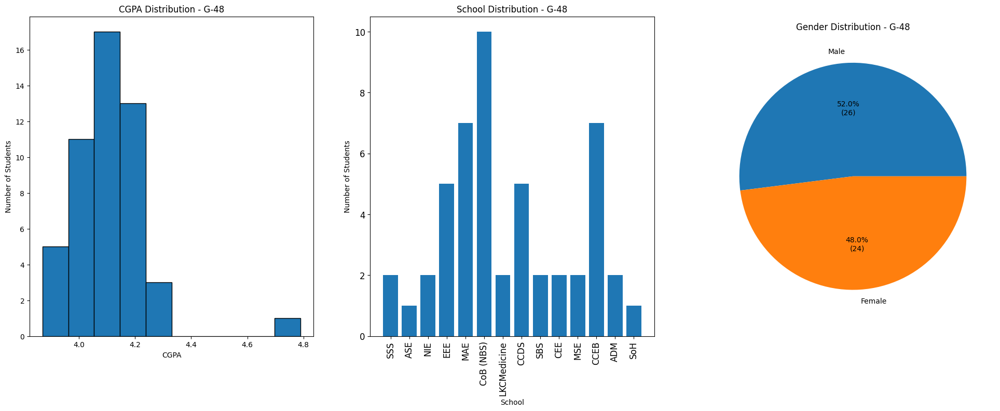


--- Tutorial Group: G-49 ---
Number of students in this group: 50


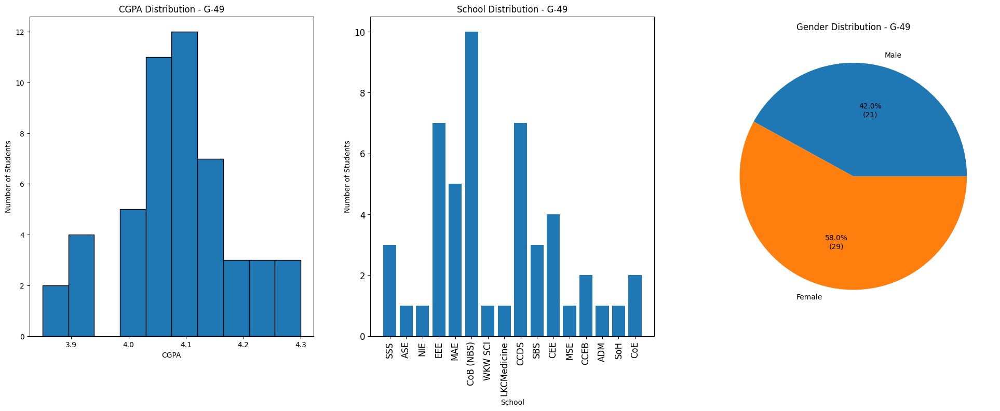


--- Tutorial Group: G-50 ---
Number of students in this group: 50


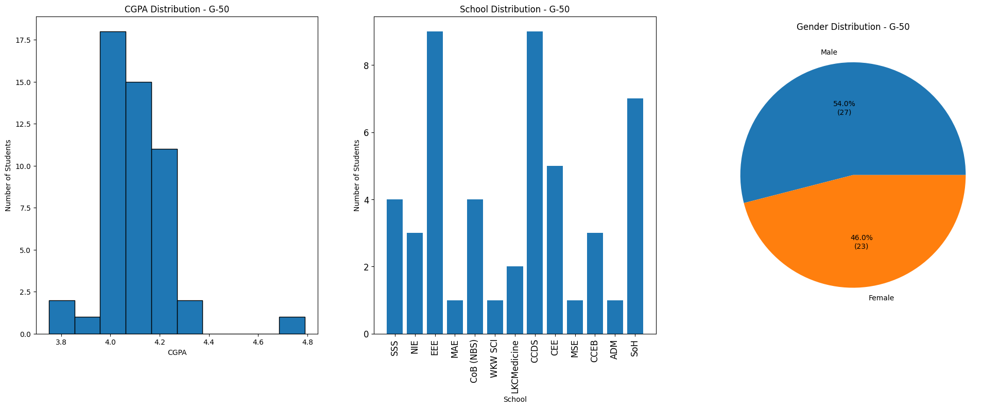


--- Tutorial Group: G-51 ---
Number of students in this group: 50


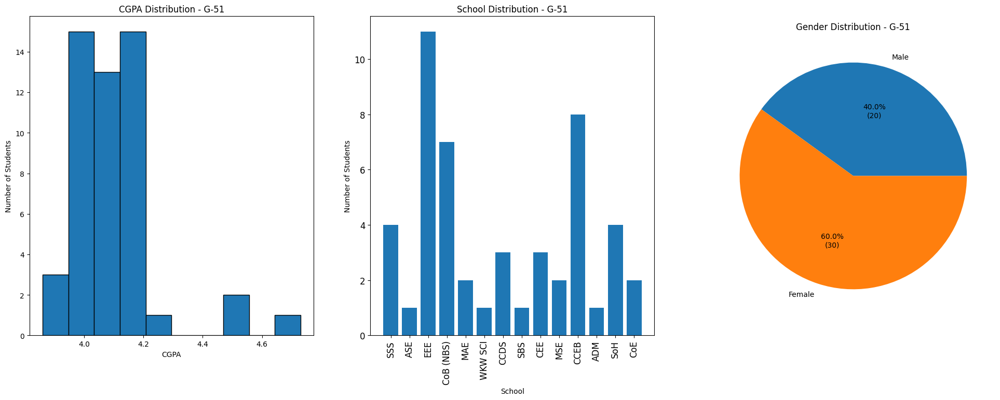


--- Tutorial Group: G-52 ---
Number of students in this group: 50


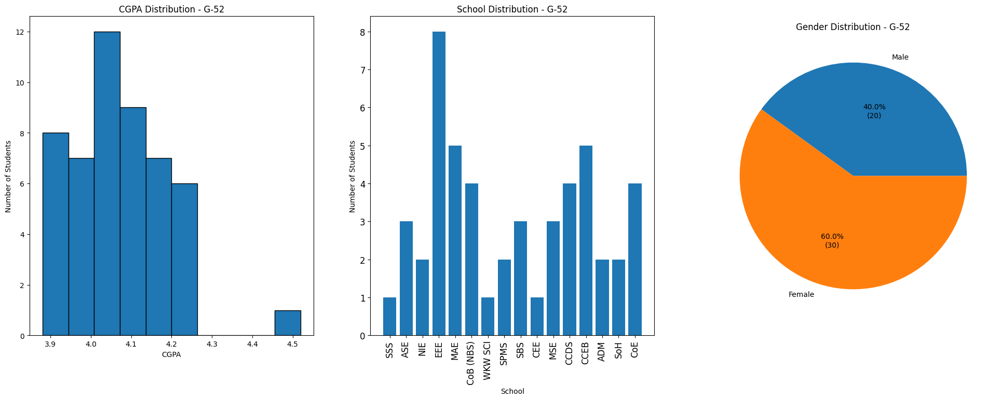


--- Tutorial Group: G-53 ---
Number of students in this group: 50


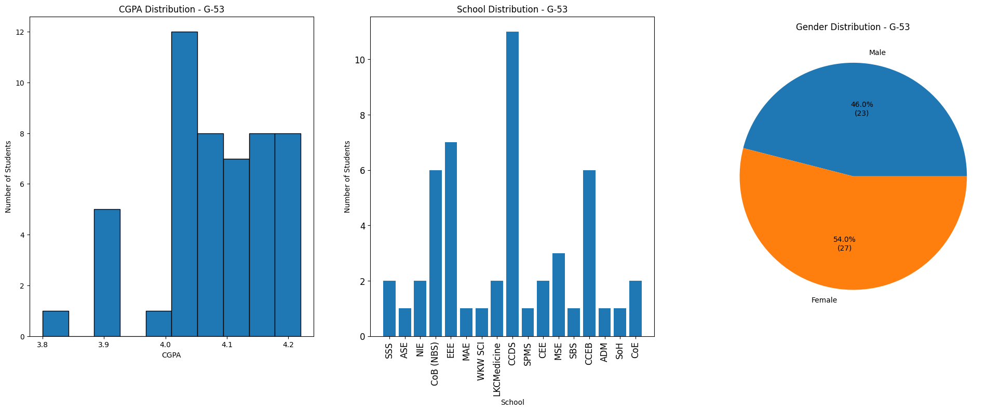


--- Tutorial Group: G-54 ---
Number of students in this group: 50


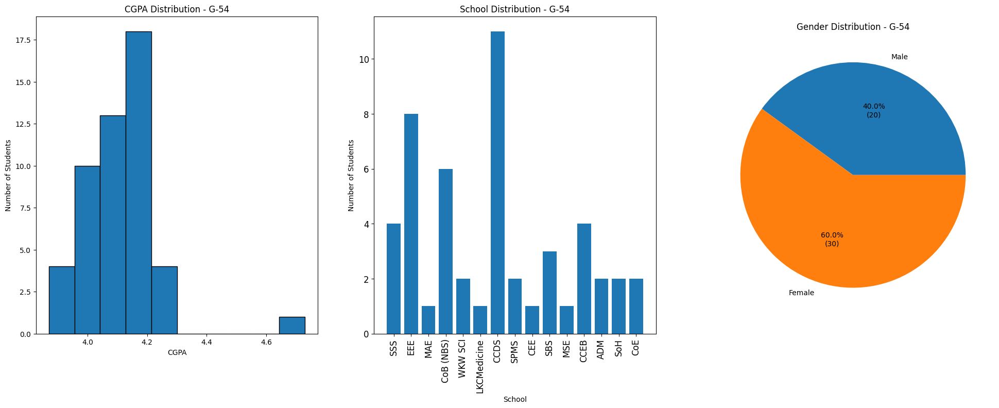


--- Tutorial Group: G-55 ---
Number of students in this group: 50


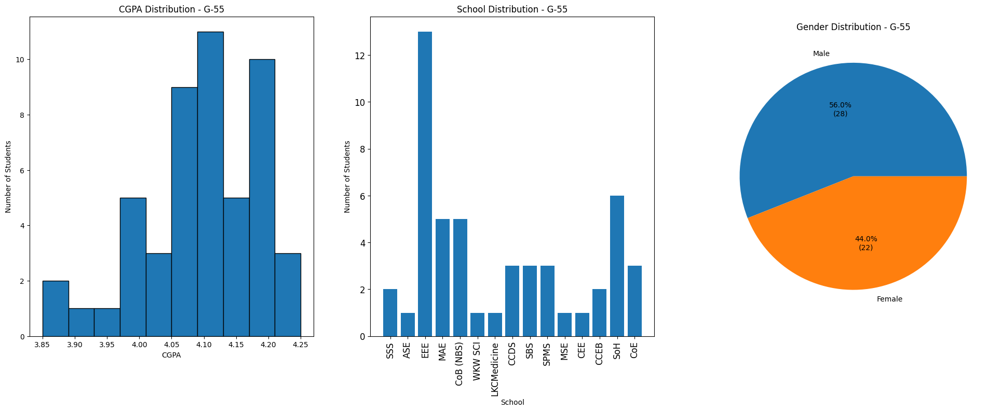


--- Tutorial Group: G-56 ---
Number of students in this group: 50


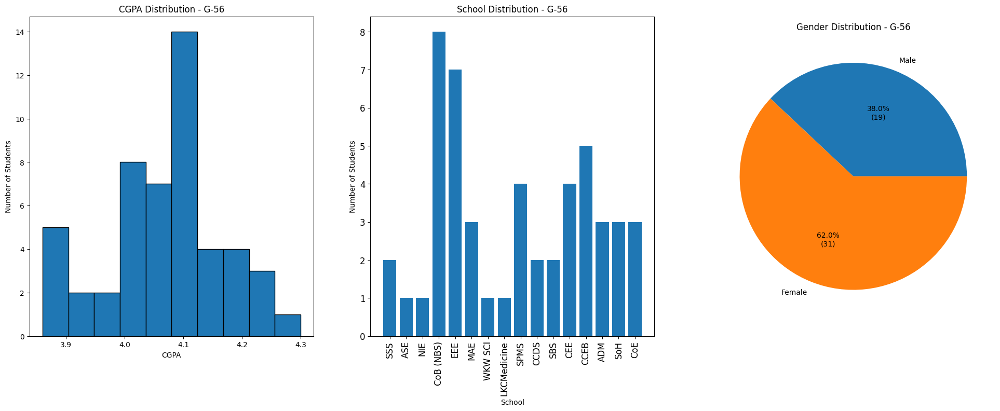


--- Tutorial Group: G-57 ---
Number of students in this group: 50


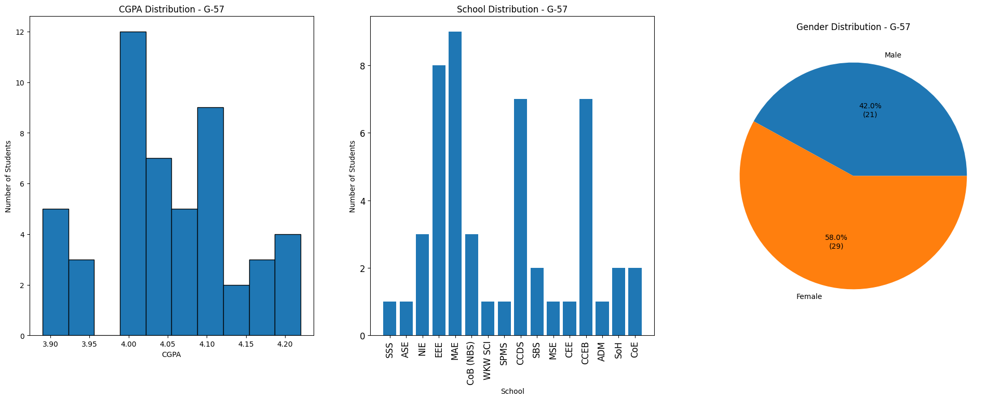


--- Tutorial Group: G-58 ---
Number of students in this group: 50


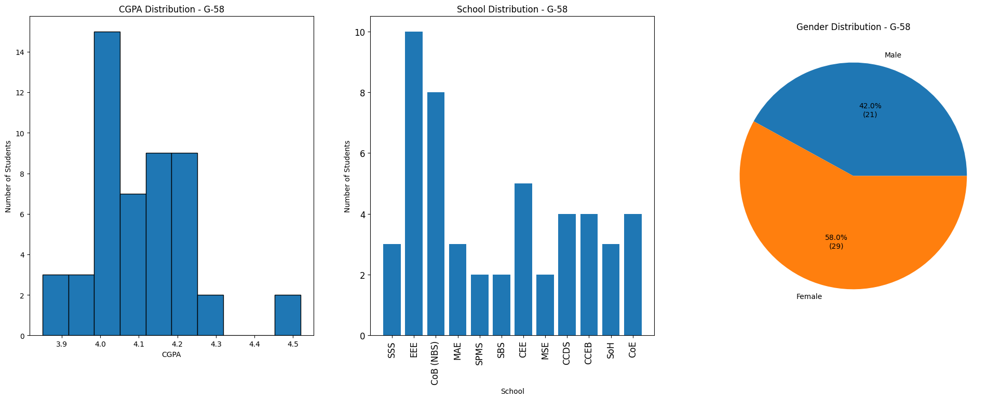


--- Tutorial Group: G-59 ---
Number of students in this group: 50


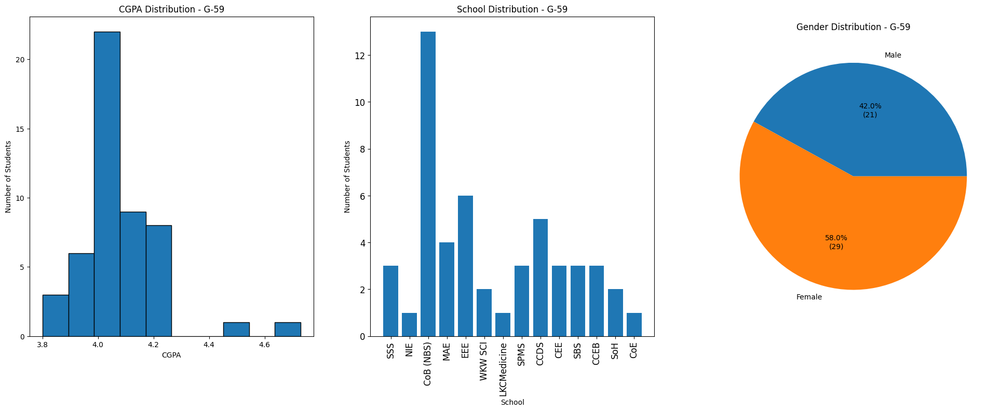


--- Tutorial Group: G-60 ---
Number of students in this group: 50


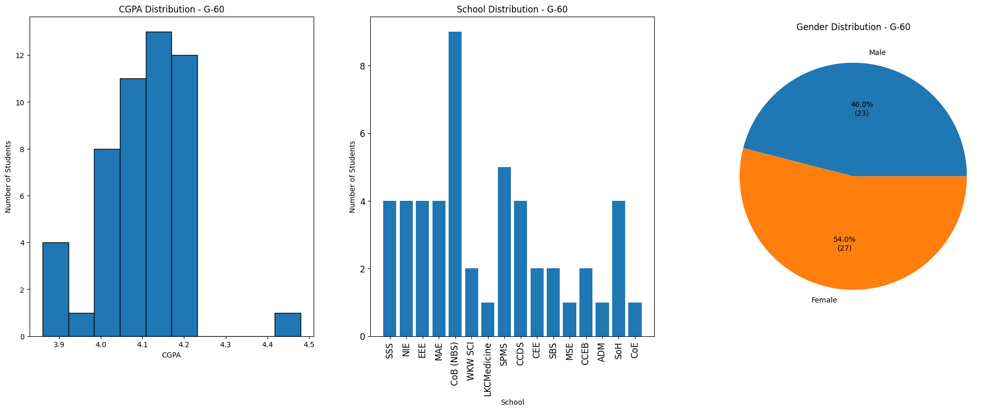


--- Tutorial Group: G-61 ---
Number of students in this group: 50


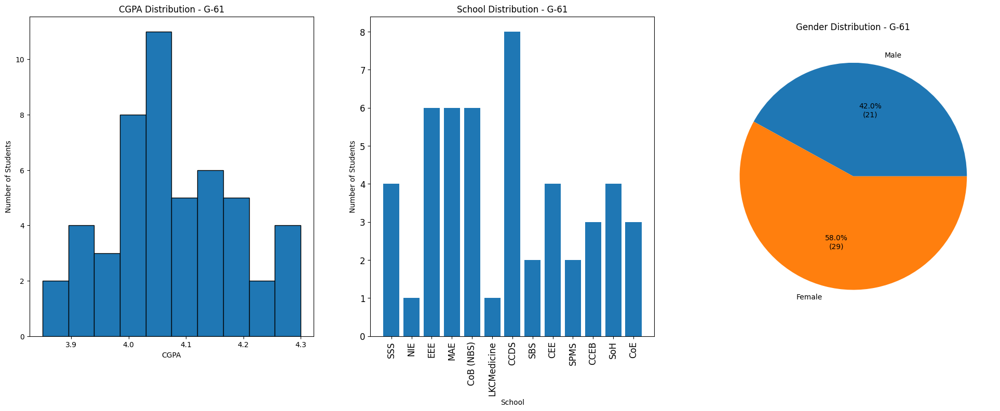


--- Tutorial Group: G-62 ---
Number of students in this group: 50


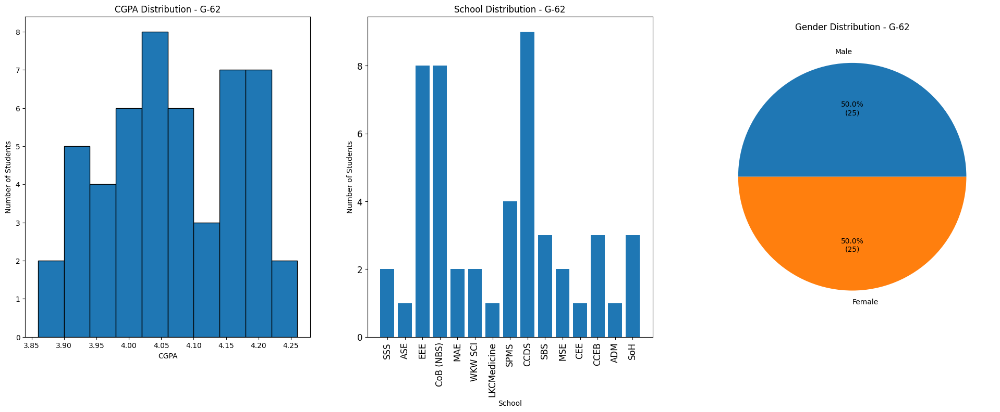


--- Tutorial Group: G-63 ---
Number of students in this group: 50


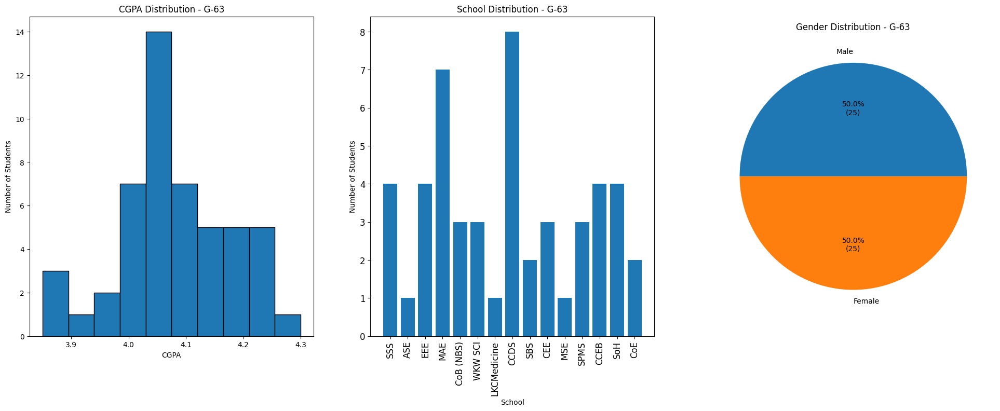


--- Tutorial Group: G-64 ---
Number of students in this group: 50


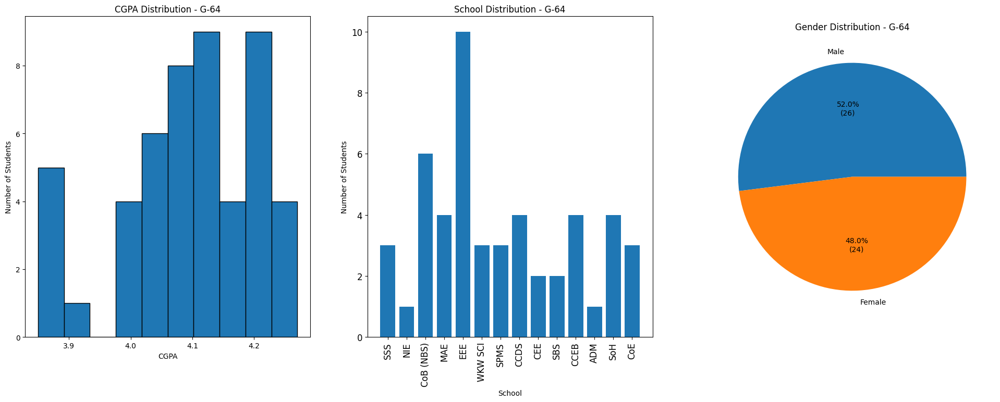


--- Tutorial Group: G-65 ---
Number of students in this group: 50


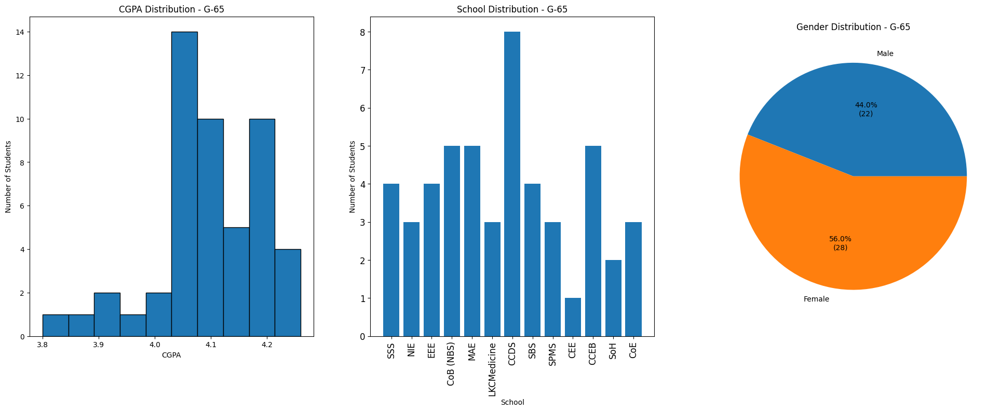


--- Tutorial Group: G-66 ---
Number of students in this group: 50


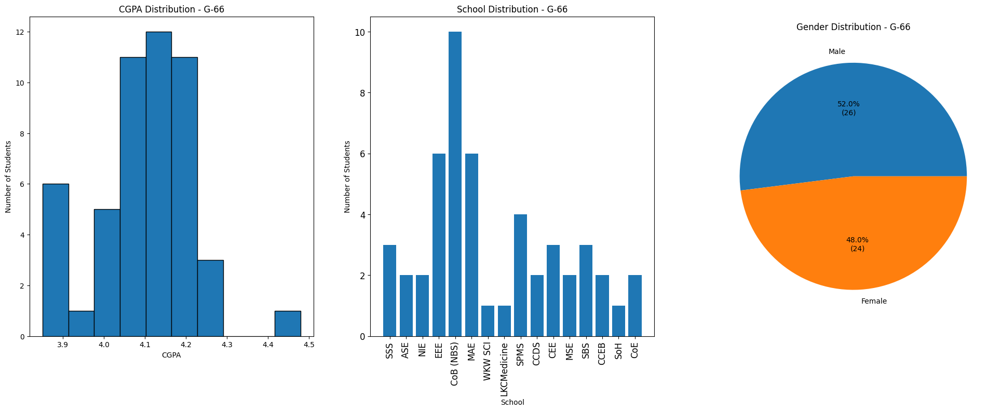


--- Tutorial Group: G-67 ---
Number of students in this group: 50


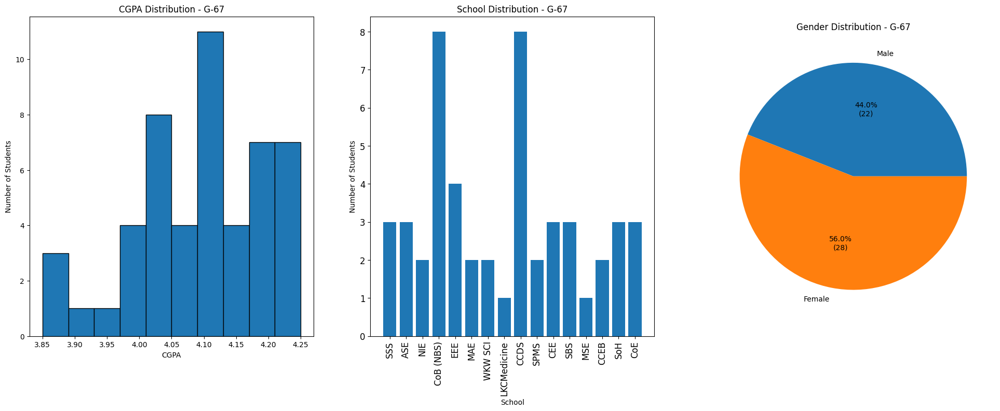


--- Tutorial Group: G-68 ---
Number of students in this group: 50


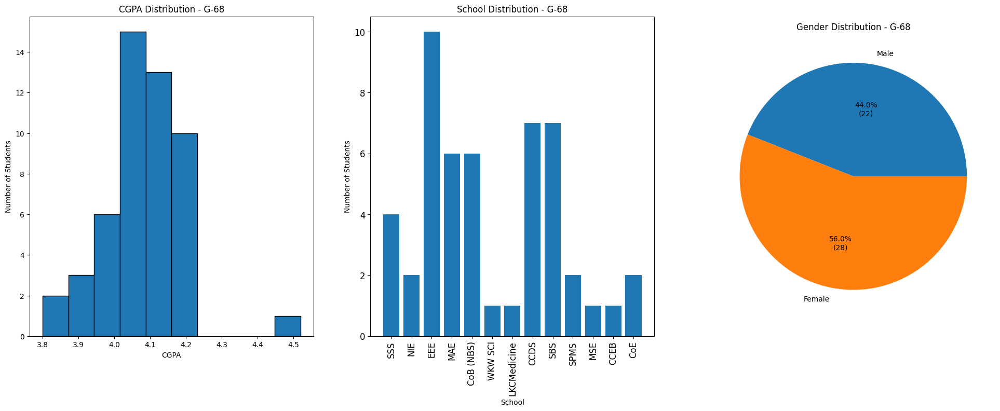


--- Tutorial Group: G-69 ---
Number of students in this group: 50


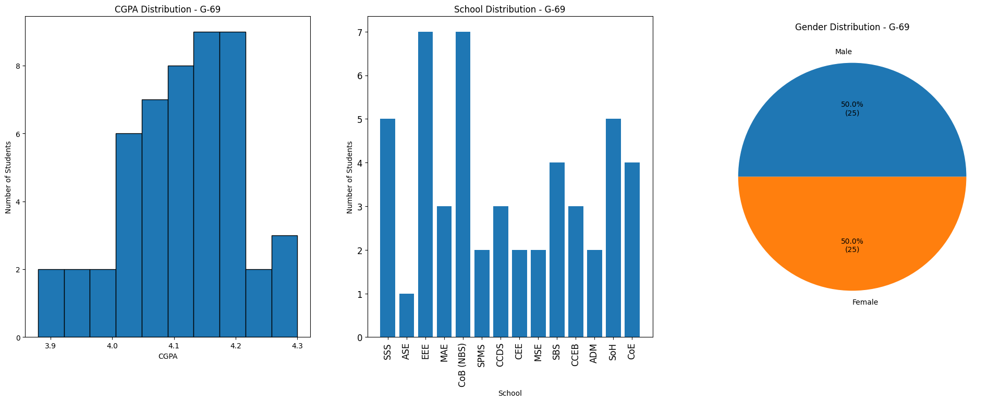


--- Tutorial Group: G-70 ---
Number of students in this group: 50


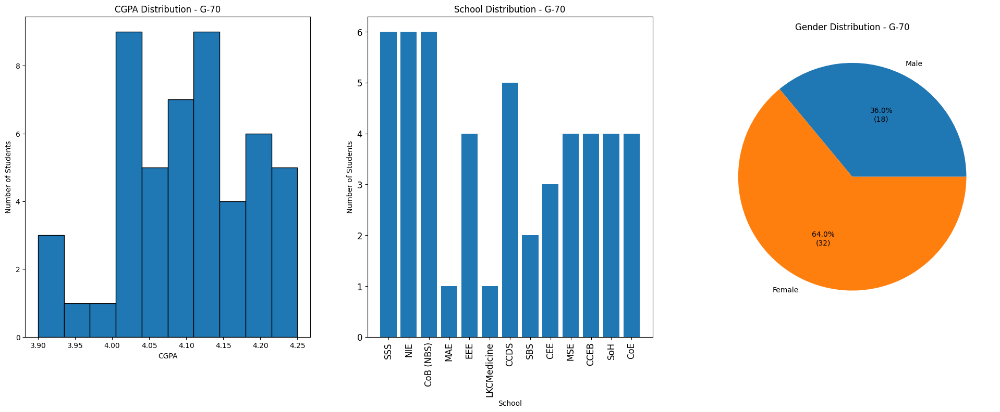


--- Tutorial Group: G-71 ---
Number of students in this group: 50


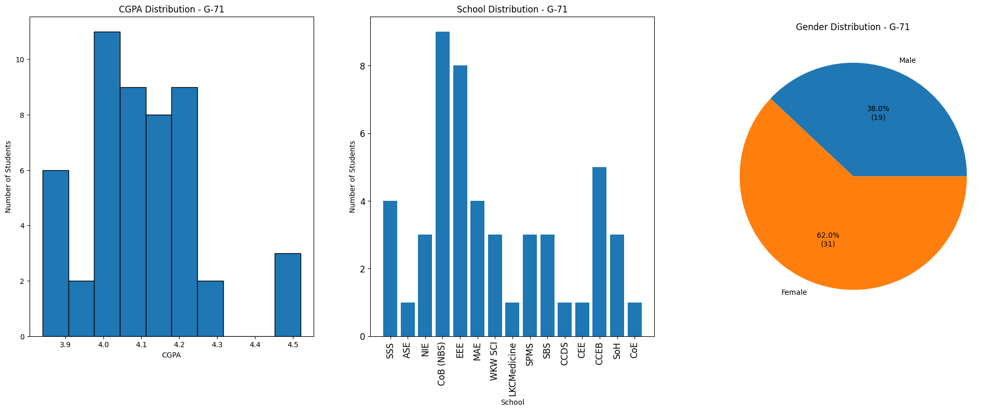


--- Tutorial Group: G-72 ---
Number of students in this group: 50


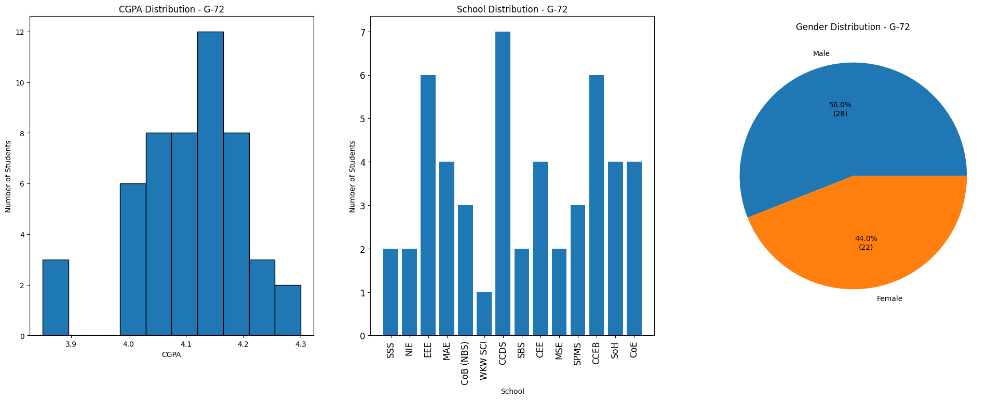


--- Tutorial Group: G-73 ---
Number of students in this group: 50


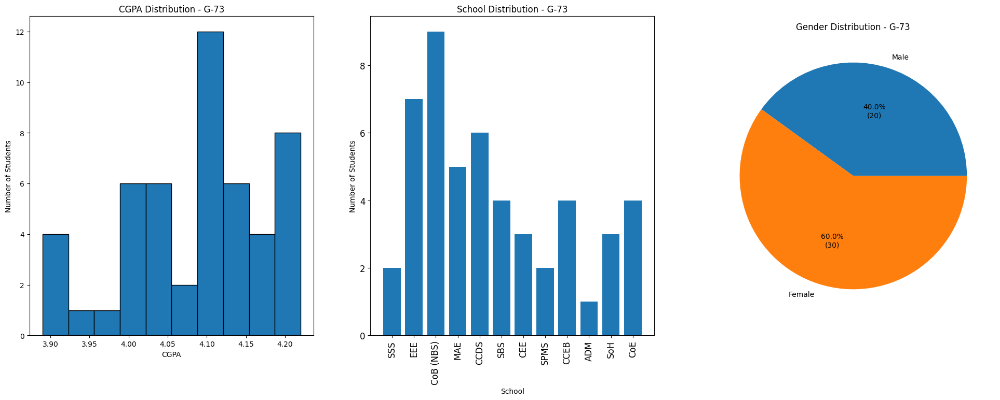


--- Tutorial Group: G-74 ---
Number of students in this group: 50


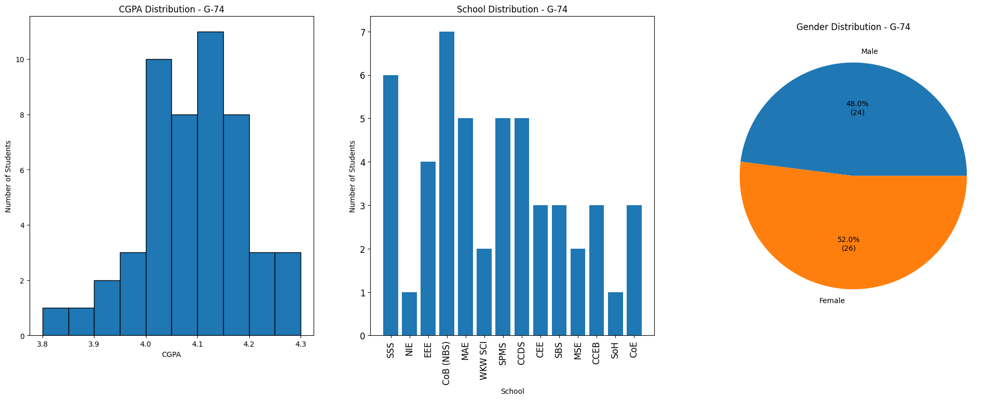


--- Tutorial Group: G-75 ---
Number of students in this group: 50


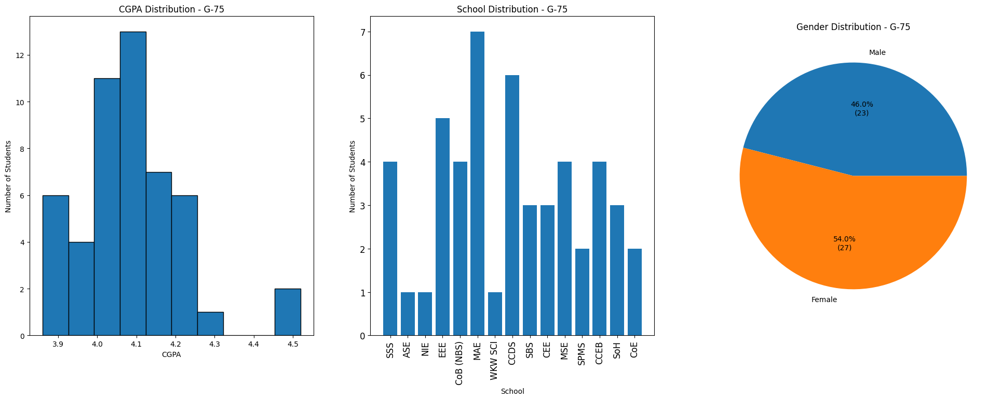


--- Tutorial Group: G-76 ---
Number of students in this group: 50


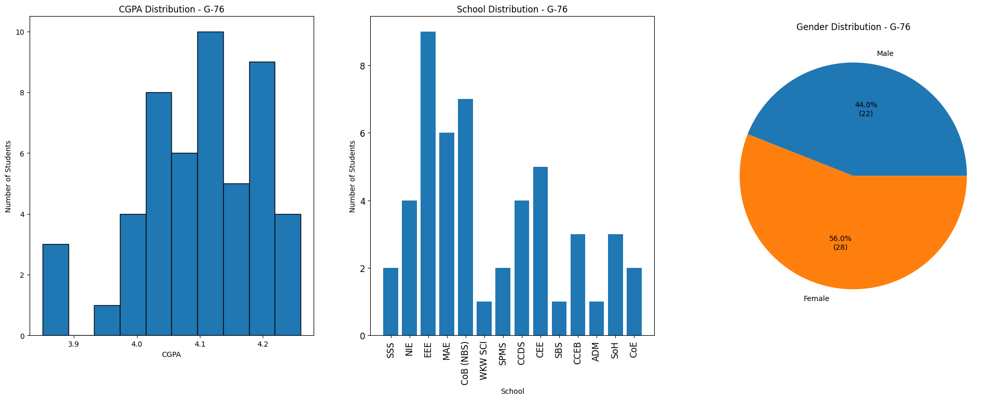


--- Tutorial Group: G-77 ---
Number of students in this group: 50


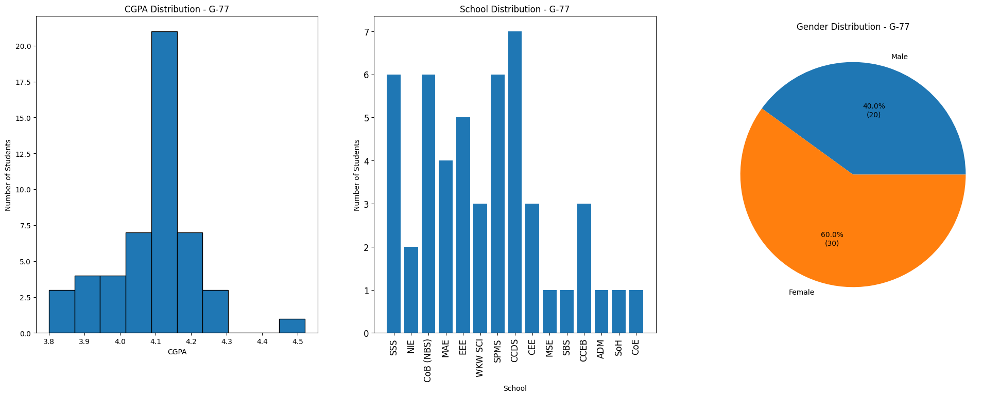


--- Tutorial Group: G-78 ---
Number of students in this group: 50


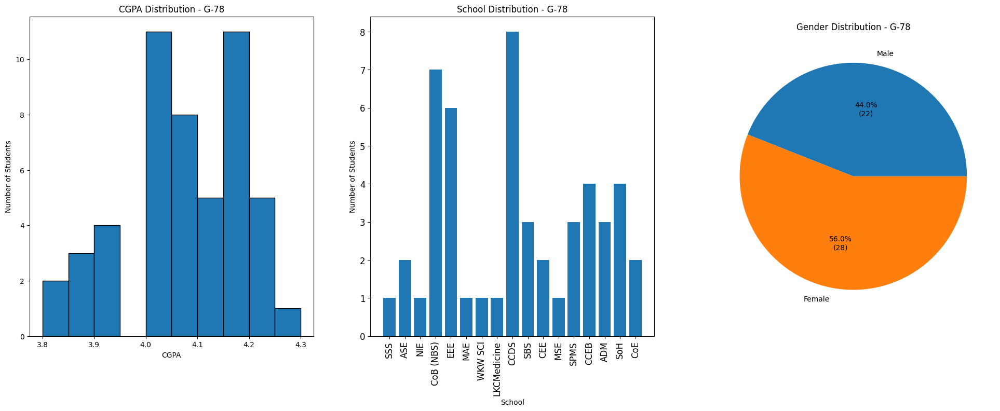


--- Tutorial Group: G-79 ---
Number of students in this group: 50


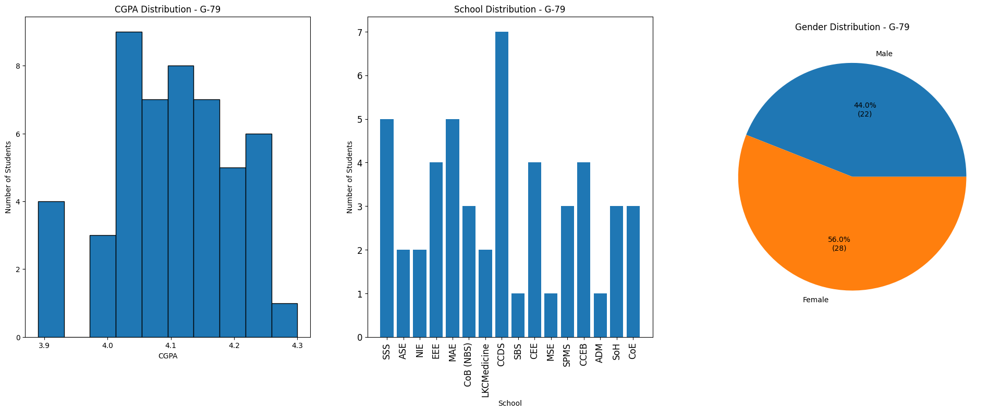


--- Tutorial Group: G-80 ---
Number of students in this group: 50


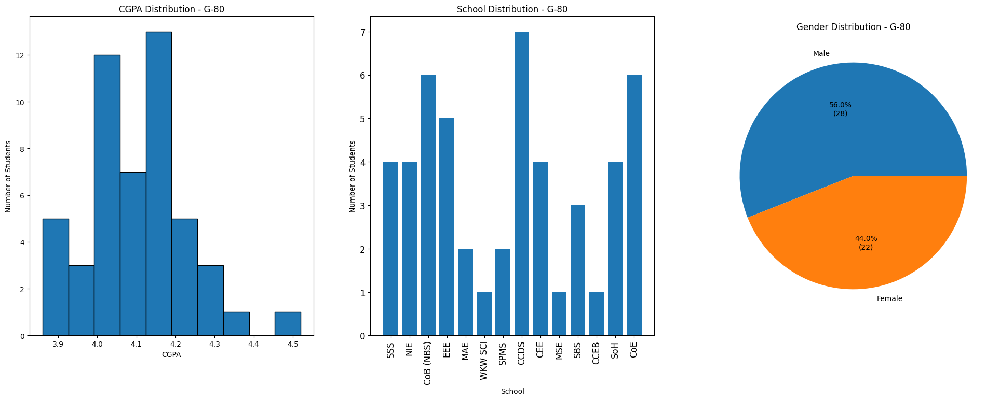


--- Tutorial Group: G-81 ---
Number of students in this group: 50


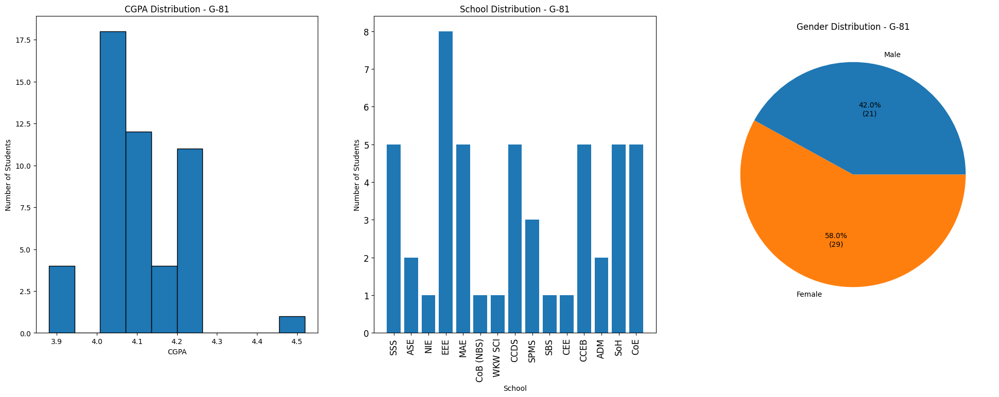


--- Tutorial Group: G-82 ---
Number of students in this group: 50


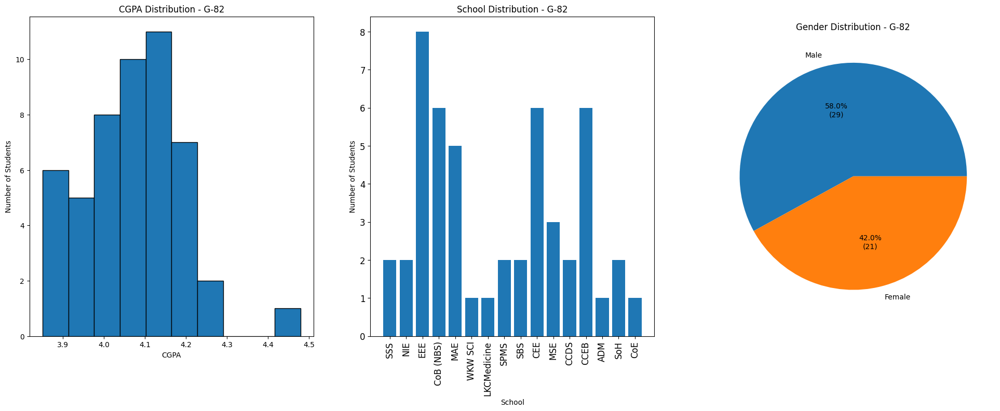


--- Tutorial Group: G-83 ---
Number of students in this group: 50


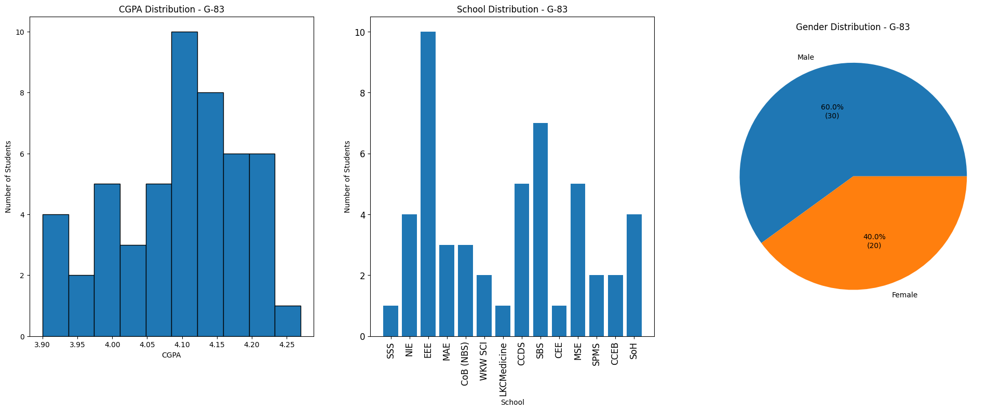


--- Tutorial Group: G-84 ---
Number of students in this group: 50


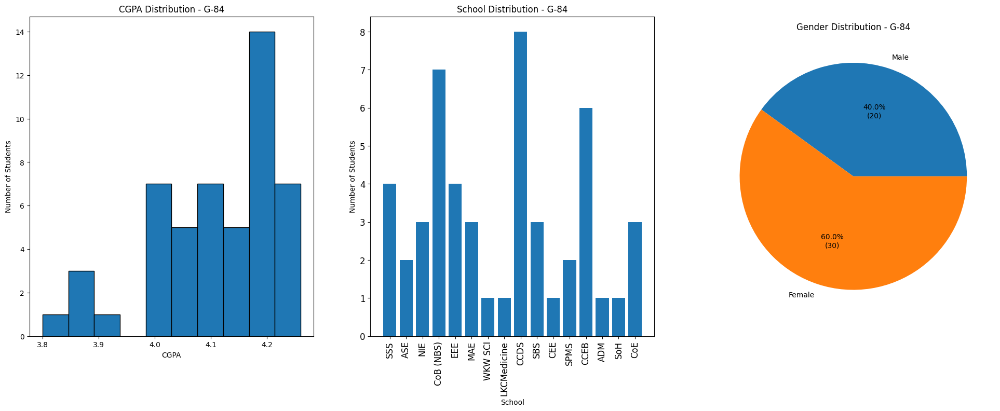


--- Tutorial Group: G-85 ---
Number of students in this group: 50


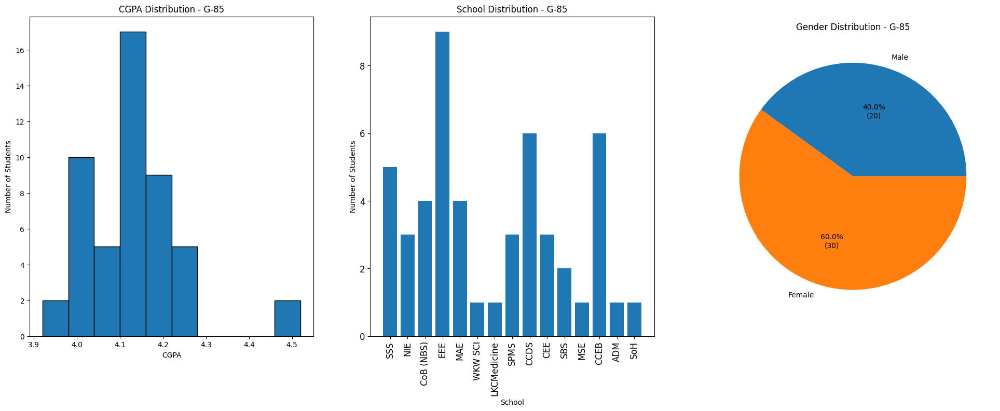


--- Tutorial Group: G-86 ---
Number of students in this group: 50


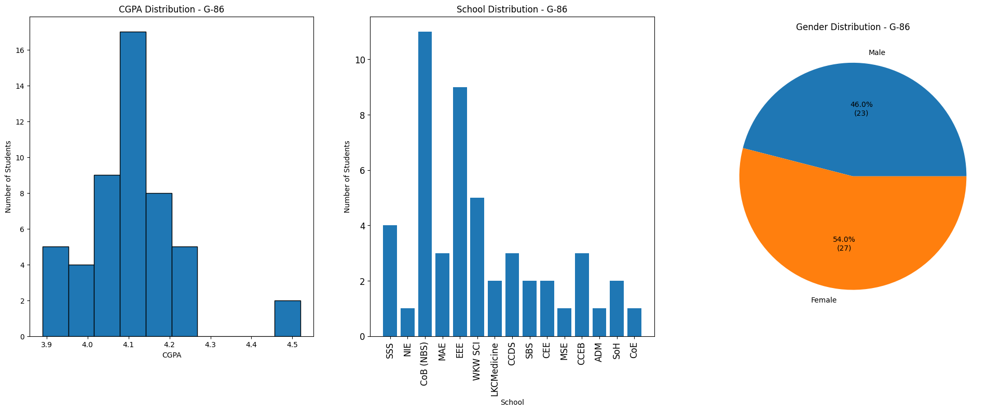


--- Tutorial Group: G-87 ---
Number of students in this group: 50


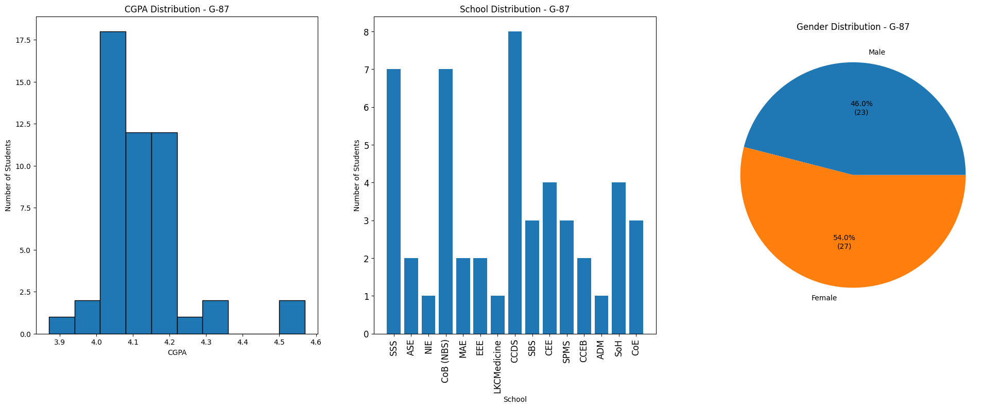


--- Tutorial Group: G-88 ---
Number of students in this group: 50


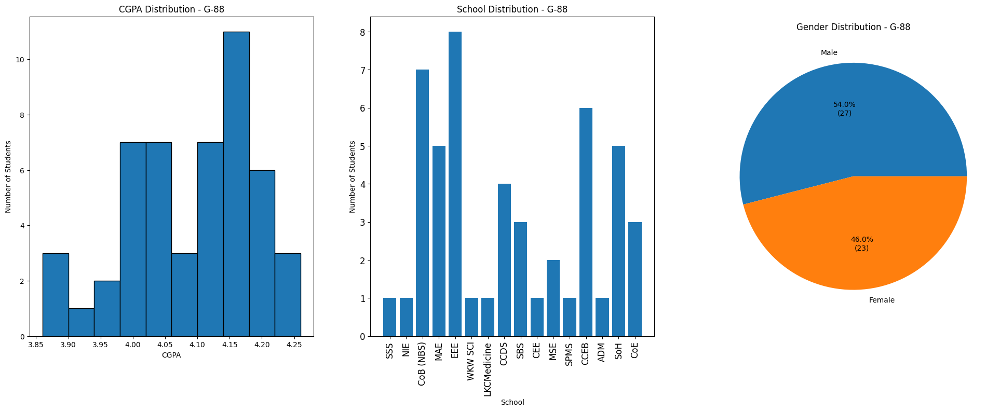


--- Tutorial Group: G-89 ---
Number of students in this group: 50


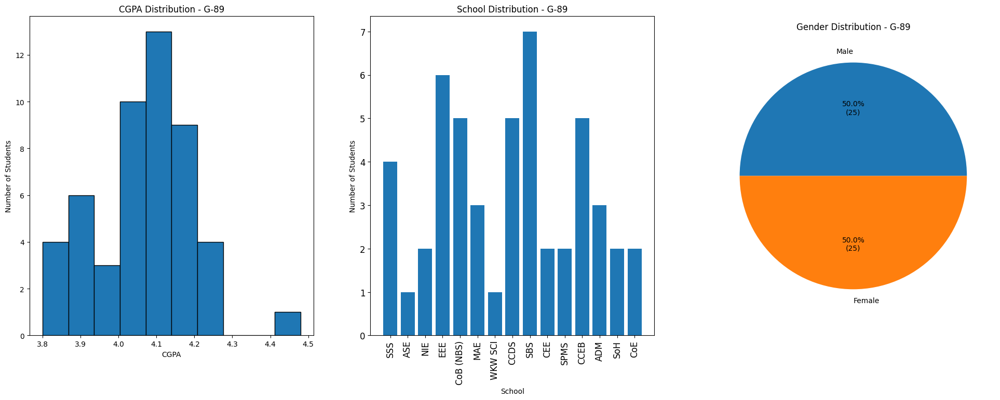


--- Tutorial Group: G-90 ---
Number of students in this group: 50


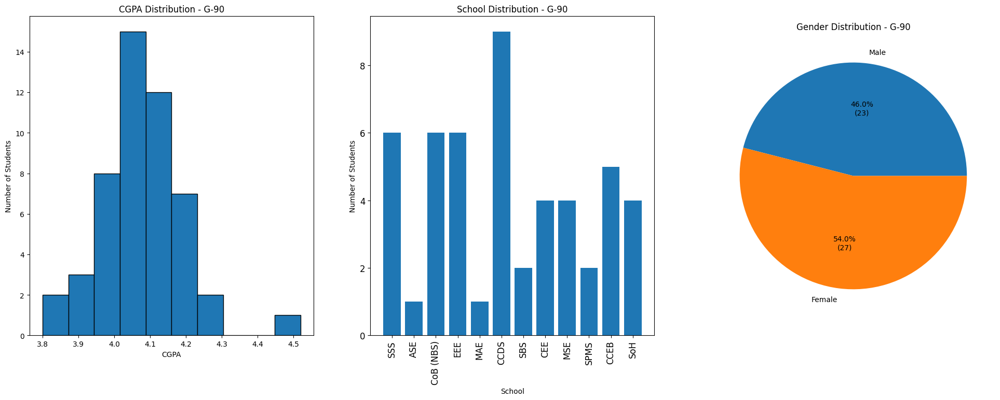


--- Tutorial Group: G-91 ---
Number of students in this group: 50


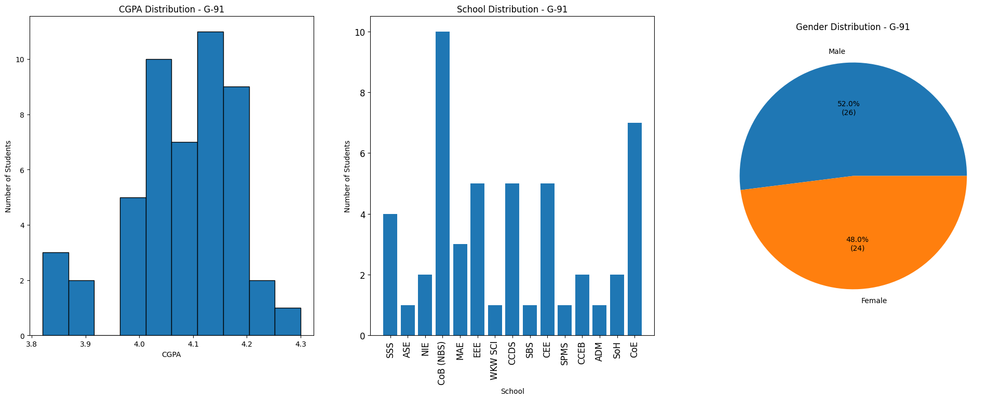


--- Tutorial Group: G-92 ---
Number of students in this group: 50


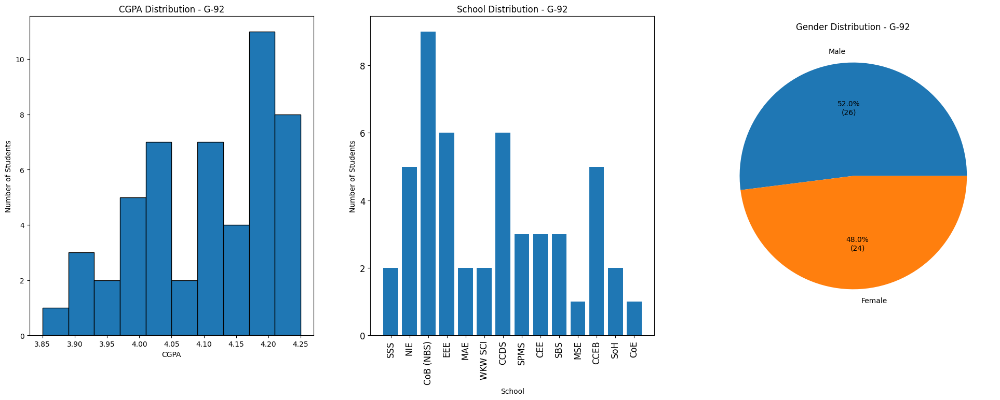


--- Tutorial Group: G-93 ---
Number of students in this group: 50


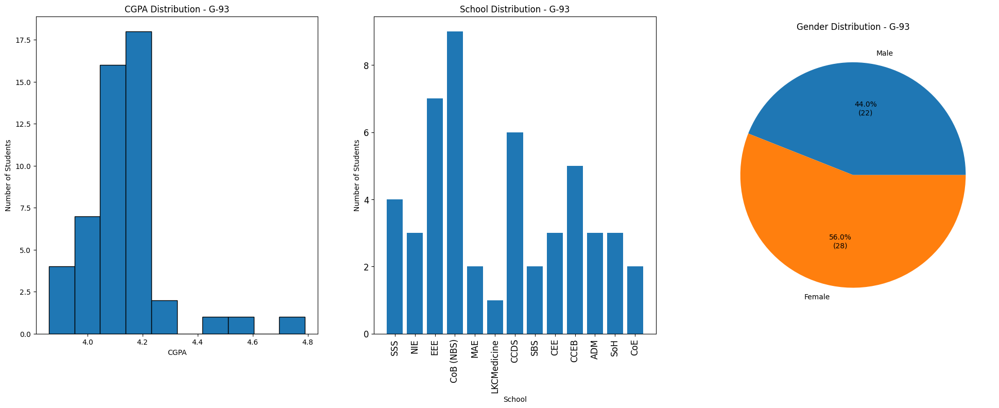


--- Tutorial Group: G-94 ---
Number of students in this group: 50


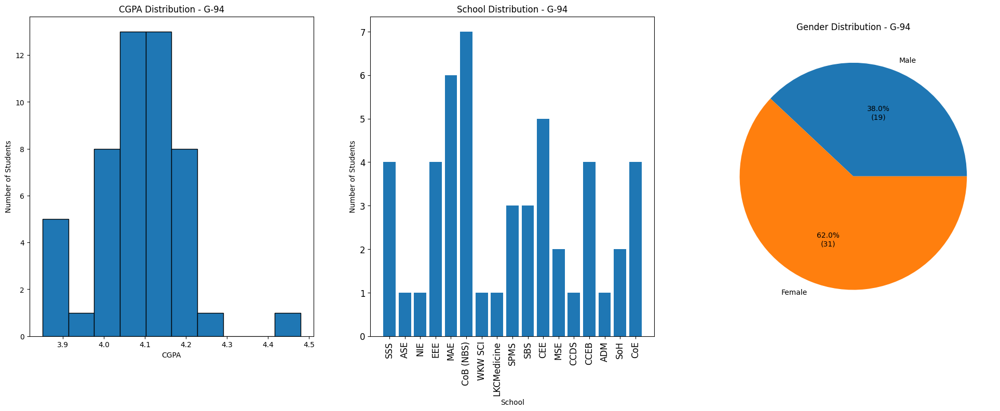


--- Tutorial Group: G-95 ---
Number of students in this group: 50


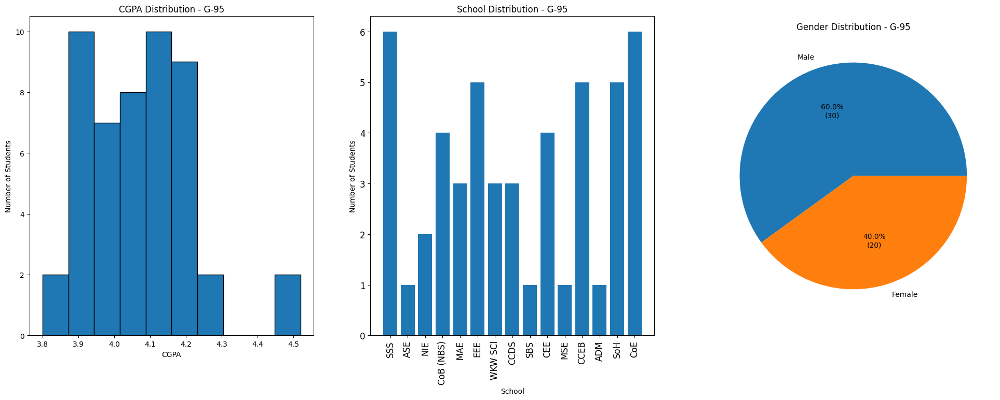


--- Tutorial Group: G-96 ---
Number of students in this group: 50


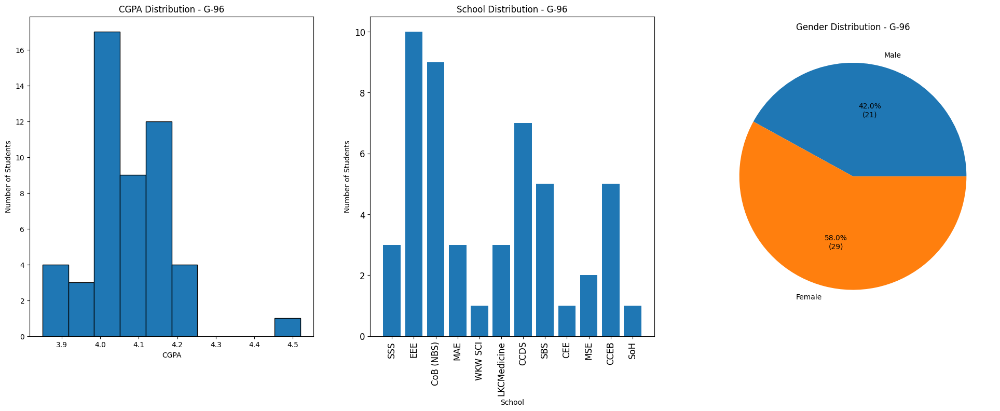


--- Tutorial Group: G-97 ---
Number of students in this group: 50


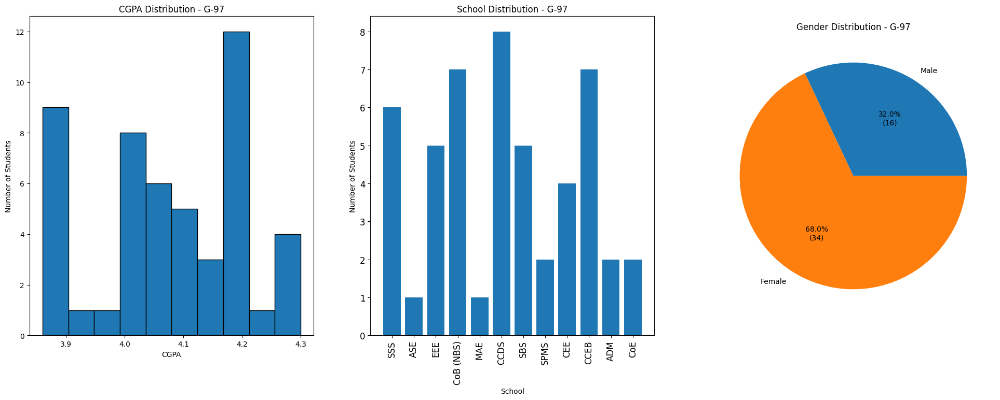


--- Tutorial Group: G-98 ---
Number of students in this group: 50


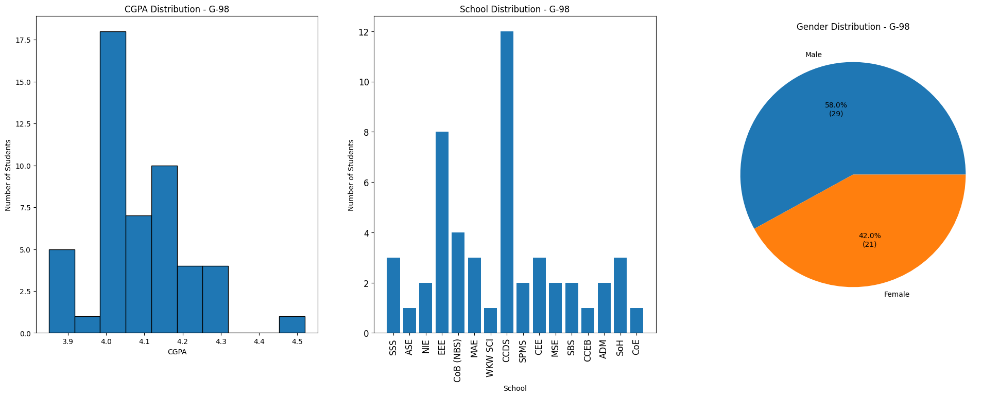


--- Tutorial Group: G-99 ---
Number of students in this group: 50


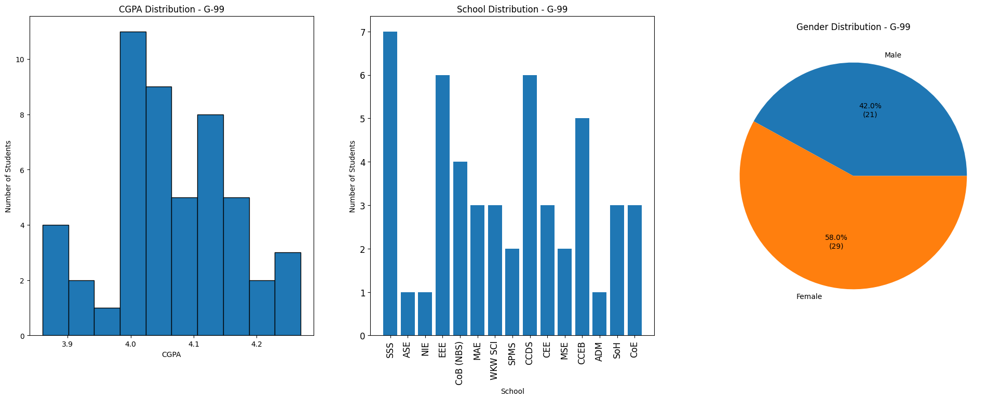


--- Tutorial Group: G-100 ---
Number of students in this group: 50


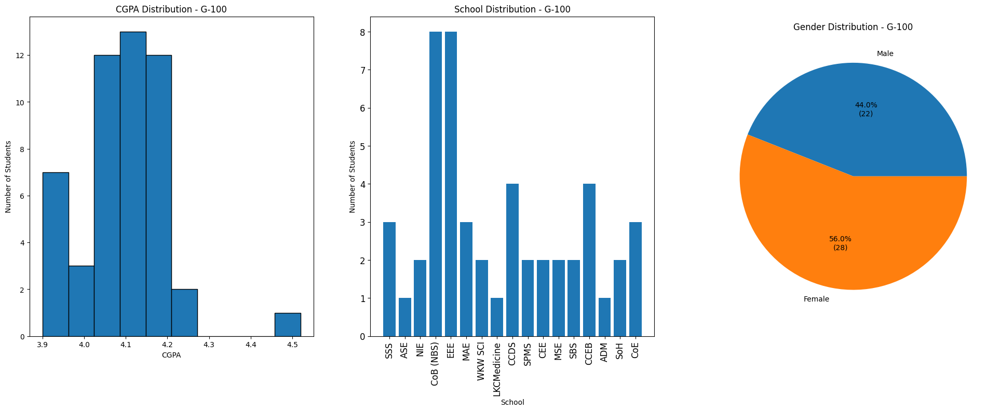


--- Tutorial Group: G-101 ---
Number of students in this group: 50


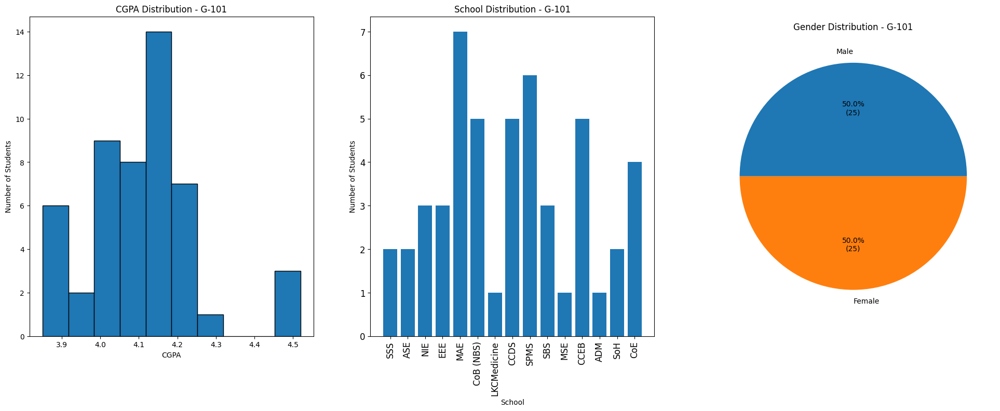


--- Tutorial Group: G-102 ---
Number of students in this group: 50


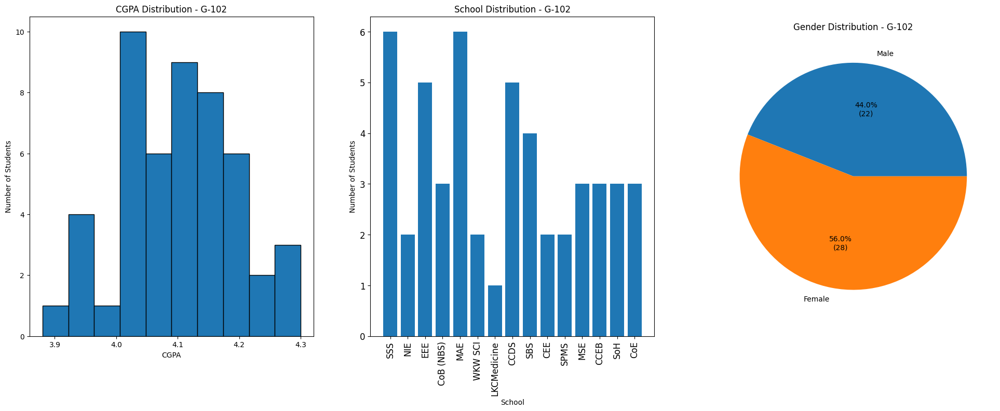


--- Tutorial Group: G-103 ---
Number of students in this group: 50


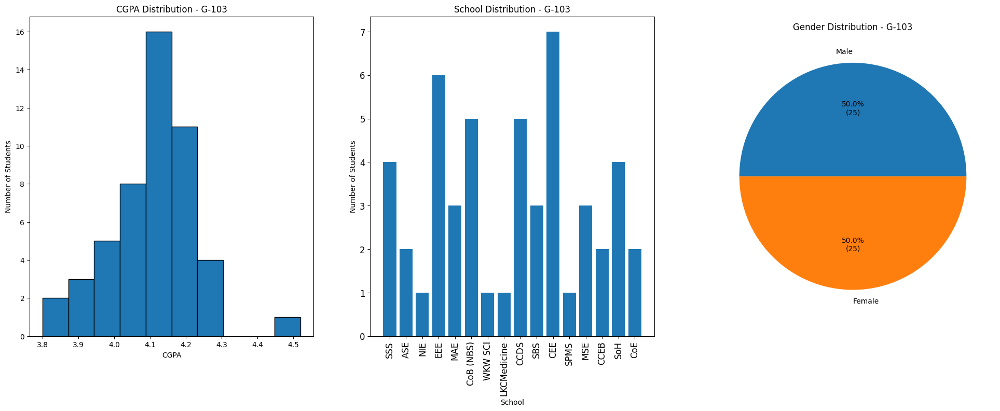


--- Tutorial Group: G-104 ---
Number of students in this group: 50


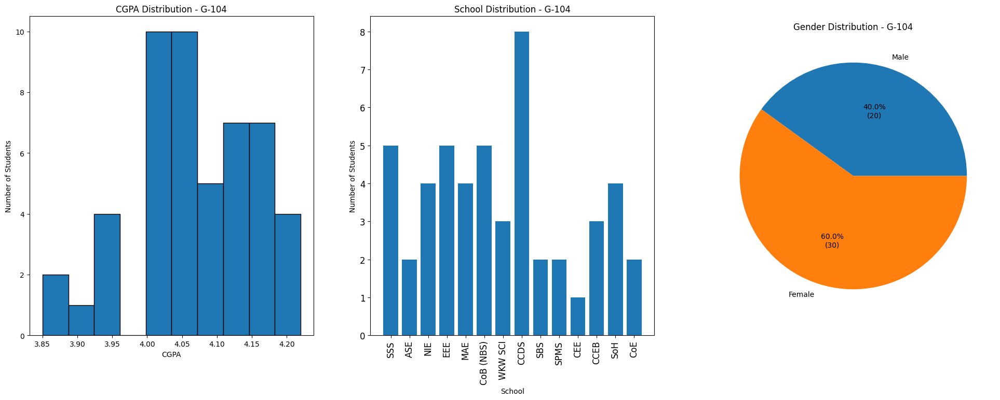


--- Tutorial Group: G-105 ---
Number of students in this group: 50


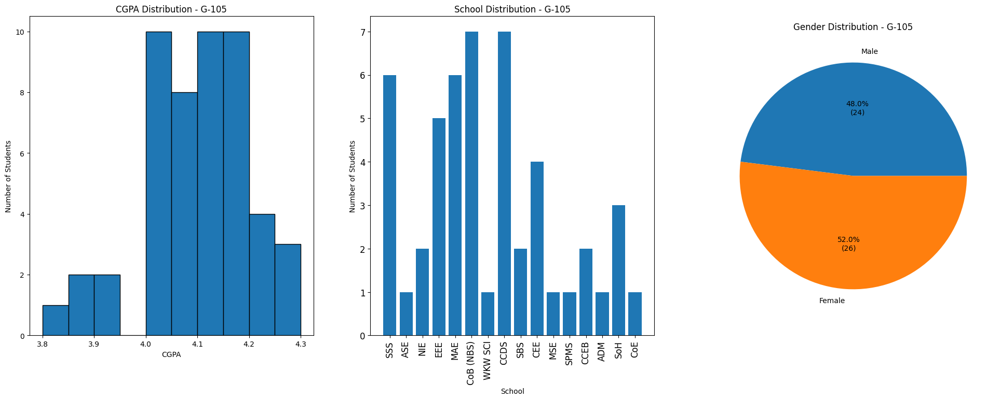


--- Tutorial Group: G-106 ---
Number of students in this group: 50


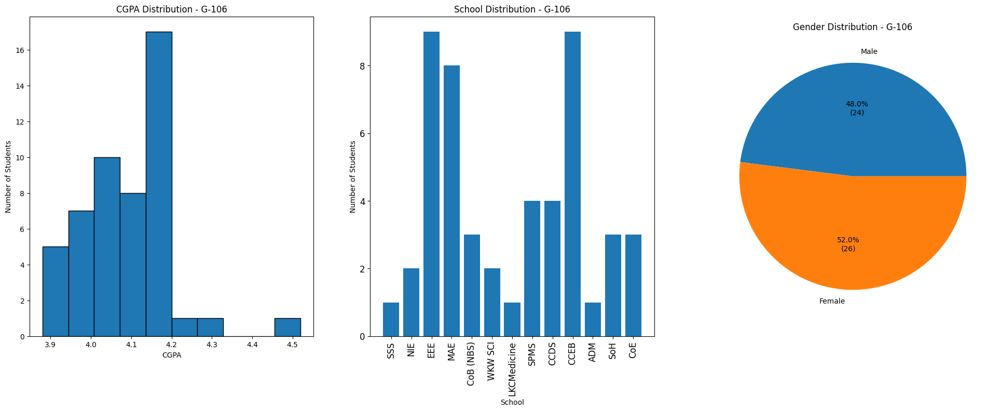


--- Tutorial Group: G-107 ---
Number of students in this group: 50


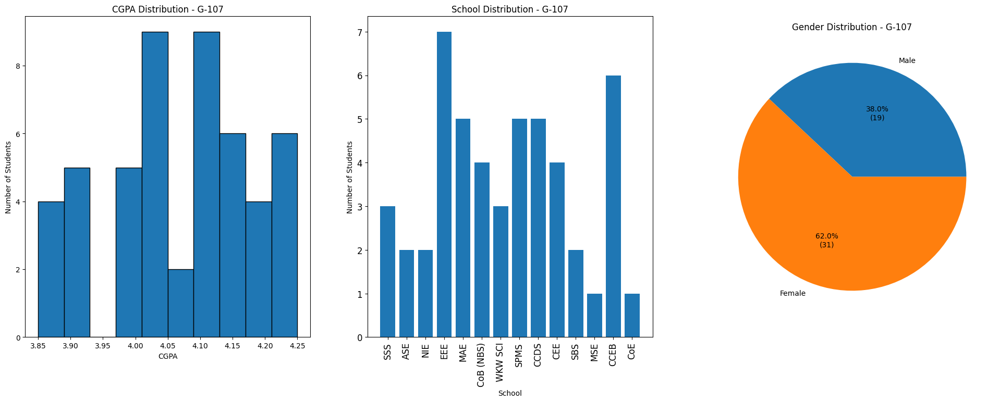


--- Tutorial Group: G-108 ---
Number of students in this group: 50


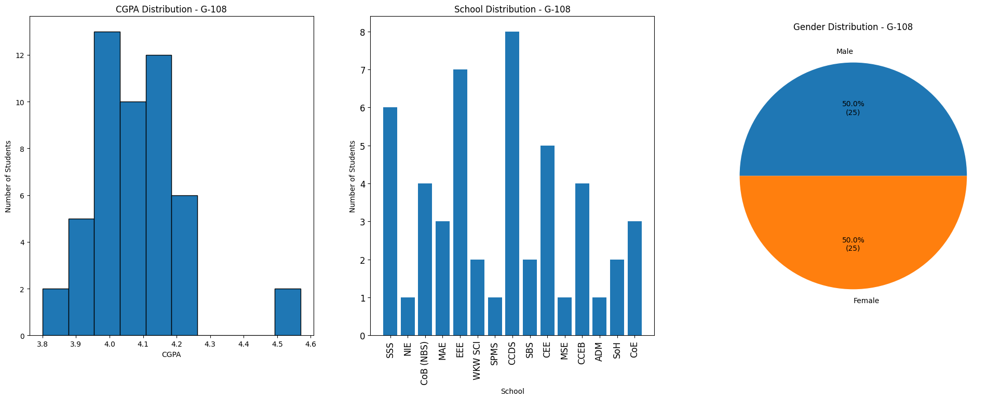


--- Tutorial Group: G-109 ---
Number of students in this group: 50


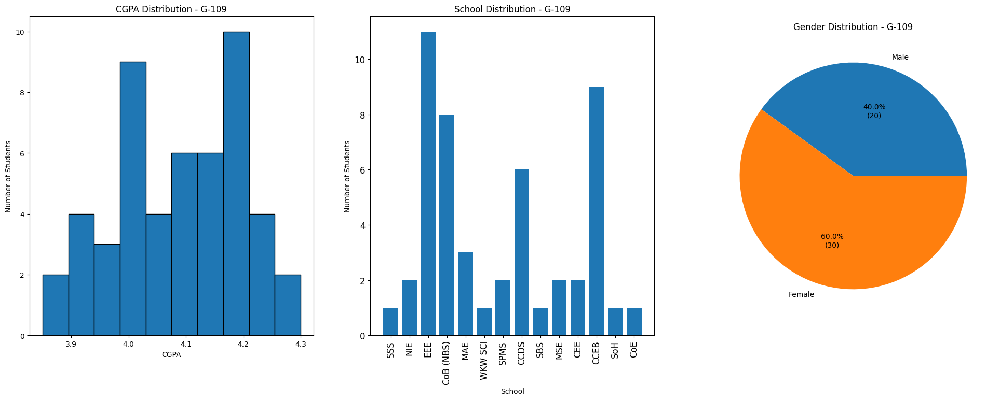


--- Tutorial Group: G-110 ---
Number of students in this group: 50


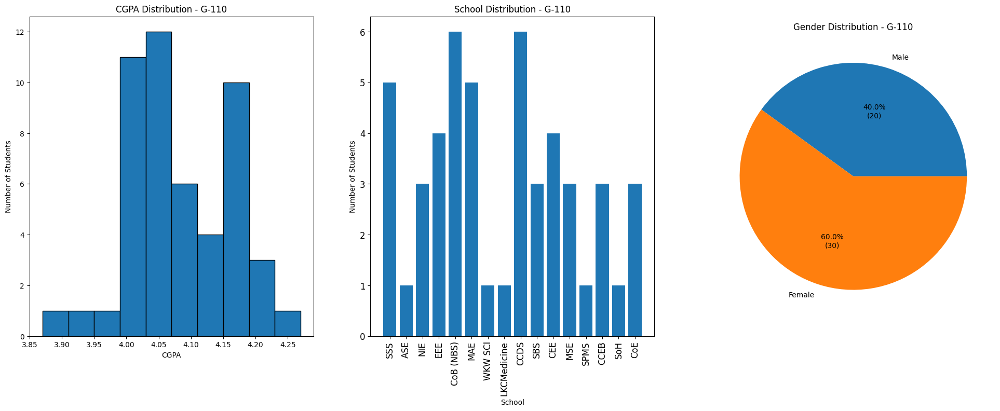


--- Tutorial Group: G-111 ---
Number of students in this group: 50


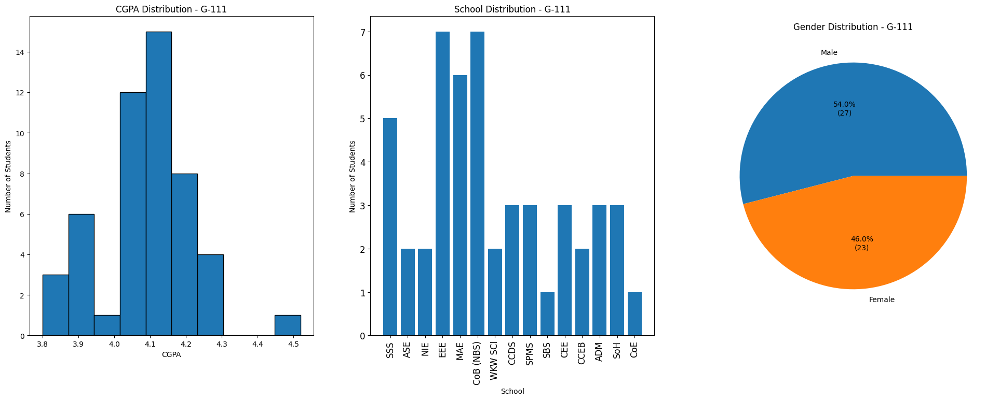


--- Tutorial Group: G-112 ---
Number of students in this group: 50


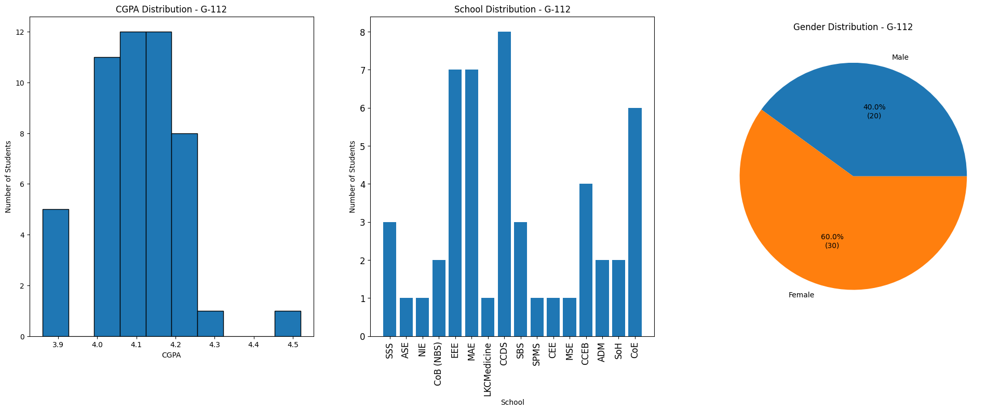


--- Tutorial Group: G-113 ---
Number of students in this group: 50


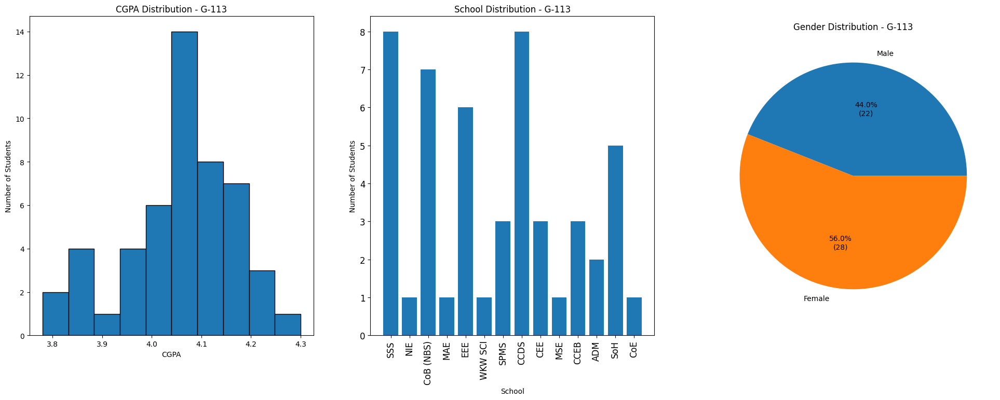


--- Tutorial Group: G-114 ---
Number of students in this group: 50


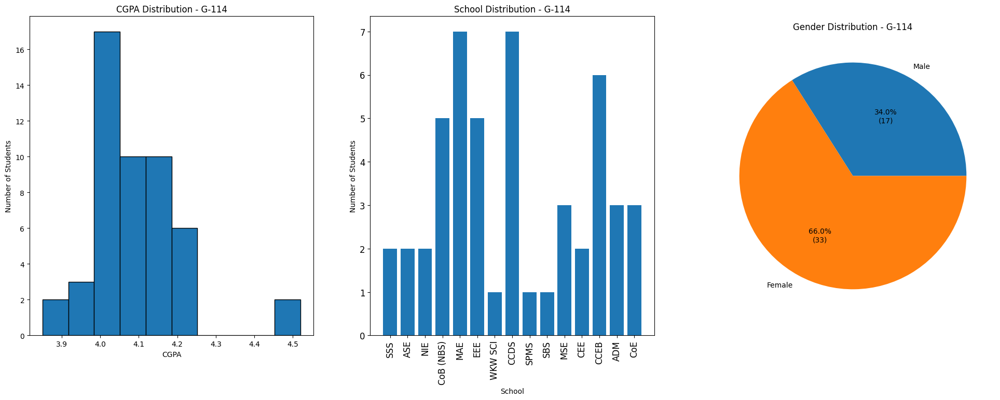


--- Tutorial Group: G-115 ---
Number of students in this group: 50


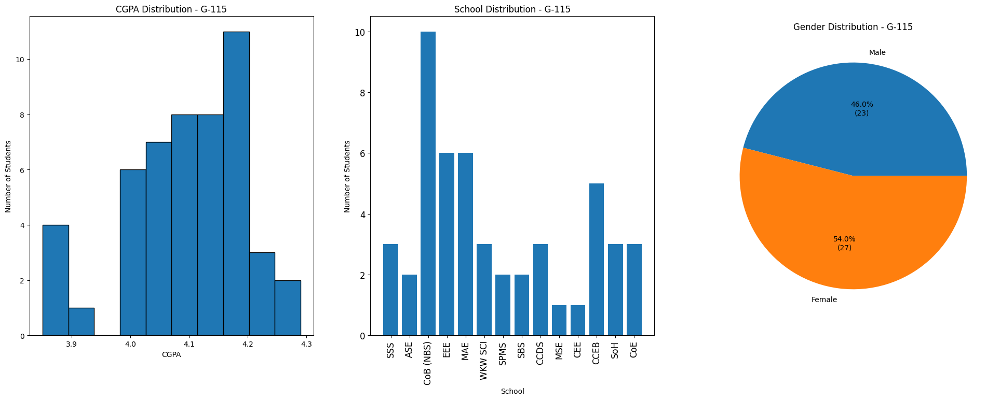


--- Tutorial Group: G-116 ---
Number of students in this group: 50


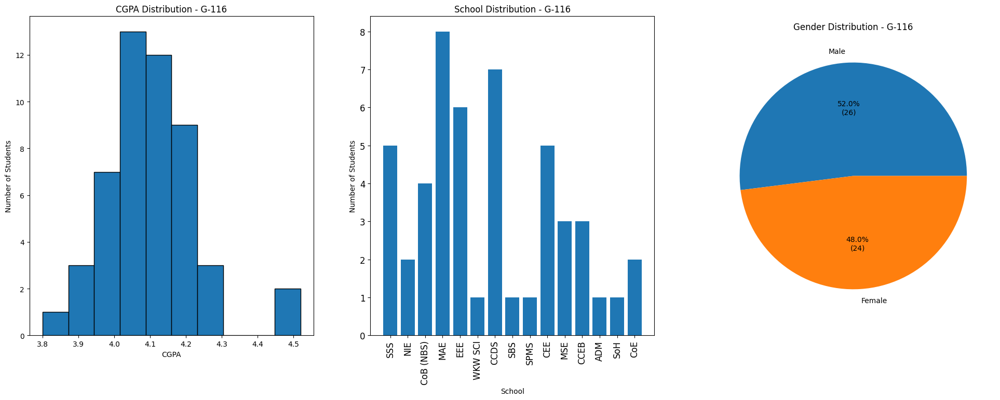


--- Tutorial Group: G-117 ---
Number of students in this group: 50


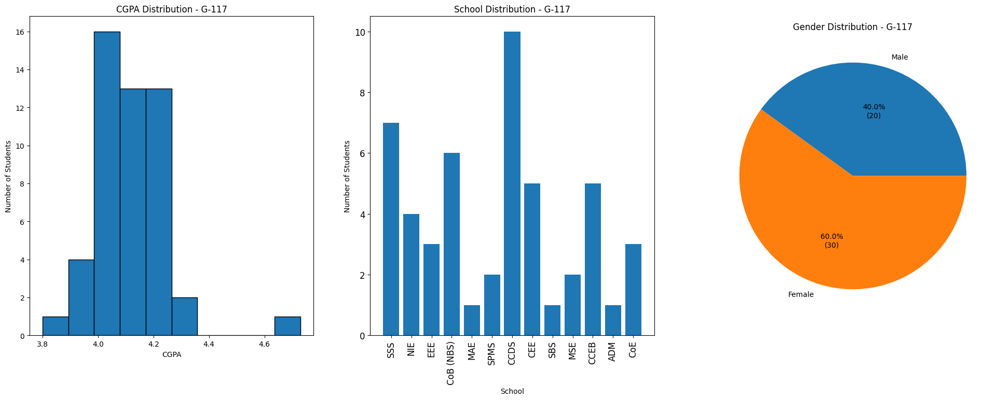


--- Tutorial Group: G-118 ---
Number of students in this group: 50


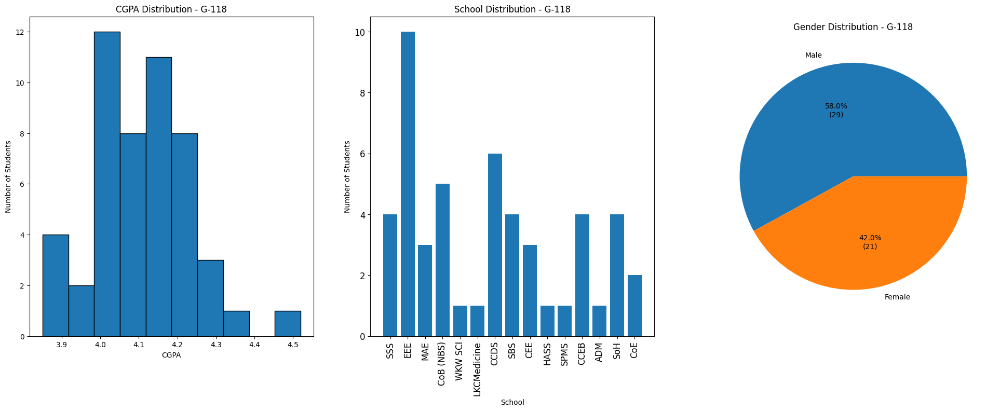


--- Tutorial Group: G-119 ---
Number of students in this group: 50


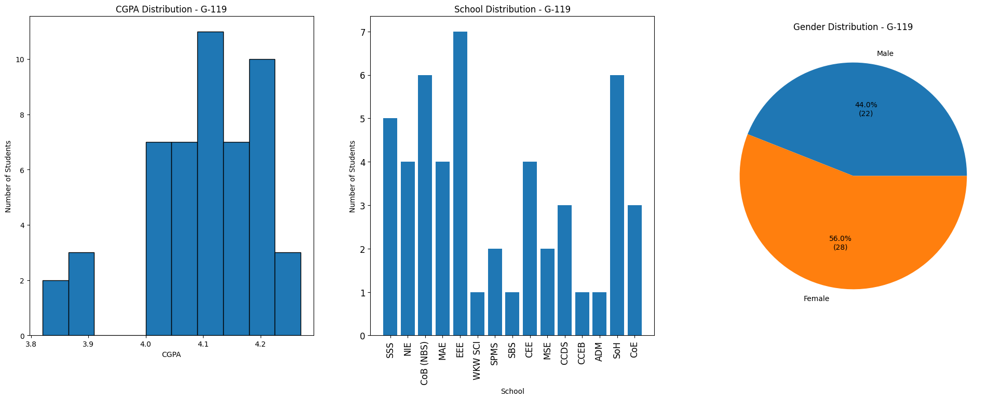


--- Tutorial Group: G-120 ---
Number of students in this group: 50


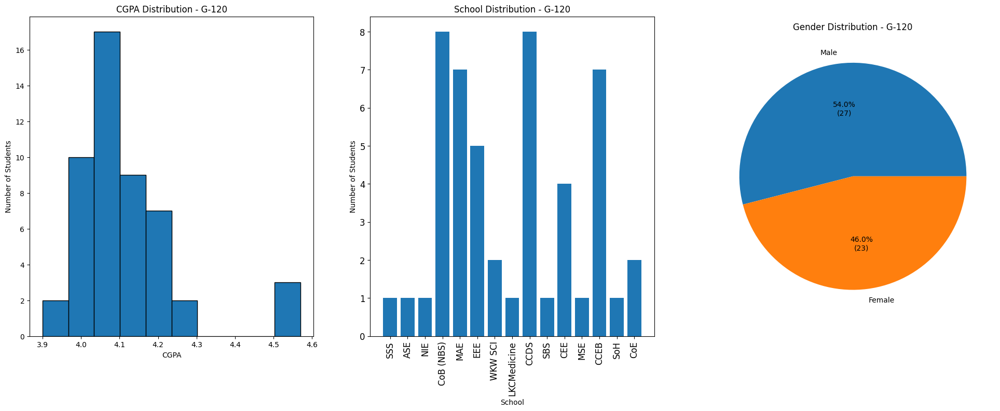

In [ ]:
filepath = '/content/drive/MyDrive/records.csv'
data_analysis(filepath)

Firstly, we conducted a data analysis in order to obtain key insights from the records file, informing our algorithm design. These graphs show us the distribution across different tutorial groups and how it is split according to CGPA, school and gender. For example, as depicted by the bar chart, some groups have more than 10 students from a single school which means that when forming groups of 5, there could be multiple students from the samle school.

## Algorithm development
- Sort 50 students into 5 CGPAs groups (10 students each)
- Group 1 being the highest GPA, and group 5 being the lowest.
- Calculate constraint scores within the team assigned.

In [ ]:
def get_group_ratios(rows, headers):
    """
    Computes categorical ratios (like gender, school)
    and numeric summaries (like GPA) for one tutorial group.
    Returns a dictionary of ratios.
    """
    ratios = {}

    # Count total students
    total = len(rows)
    if total == 0:
        return ratios

    for col in headers:
        if col in ('Tutorial Group', 'Name', 'Student ID'):
            continue

        values = [r[col] for r in rows if r.get(col)]

        # Handle categorical data
        if col in ('Gender', 'School'):
            counts = Counter(values)
            ratios[col] = {k: v/total for k, v in counts.items()}

    return ratios

In [ ]:
#Here, for each tutorial group, we are splitting the tutorial group into 5 gpa groups
def gpagroups(tutorial_group, csv_path):
    students = []
    group_1, group_2, group_3, group_4, group_5 = [], [], [], [], []

    headers, data = csvReader(csv_path)
    if data is None:
        return [], [], [], [], [] # exception handling, returning empty lists

    # filter by tutorial group
    for row in data:
        if row.get('Tutorial Group', '').strip() == tutorial_group:
            try:
                gpa = float(row['CGPA'])
                row['CGPA'] = gpa  # store GPA as float
                students.append(row)
            except (ValueError, KeyError):
                continue

    # sort by GPA descending
    students.sort(key=lambda s: s['CGPA'], reverse=True)

    # group into chunks of 10
    group_1 = students[0:10]
    group_2 = students[10:20]
    group_3 = students[20:30]
    group_4 = students[30:40]
    group_5 = students[40:50]

    return group_1, group_2, group_3, group_4, group_5



# when defining the groupformer, for loop looping

def groupformer(group_1, group_2, group_3, group_4, group_5, target_ratios, target_fields=None):
    """
    Forms mixed groups of 5 students (1 from each GPA band),
    choosing students that best preserve the given target ratios.
    """
    tiers = [group_1, group_2, group_3, group_4, group_5]
    groups_of_5 = []

    min_len = min(len(g) for g in tiers) # checking if each gpa tier has sufficient amount of people
    if min_len == 0:
        print("Not enough students in one of the GPA tiers.")
        return []

    if target_fields is None:
        target_fields = list(target_ratios.keys())

    # Score function based on deviation from target ratios (defining a function in a function allows us to omnit multiple
    def group_ratio_score(candidate, current_group):
        temp_group = current_group + [candidate]
        score = 0

        for field in target_fields:
            group_counts = Counter(s[field] for s in temp_group)
            total = len(temp_group)

            for category, target_ratio in target_ratios[field].items():
                group_ratio = group_counts.get(category, 0) / total
                score -= abs(group_ratio - target_ratio)
        return score

      # Form each group
    for i in range(min_len):
        current_group = []

        for tier in tiers: # loop through each GPA group
            if not tier:
                continue

            best_student = max(tier, key=lambda s: group_ratio_score(s, current_group))
            current_group.append(best_student)
            tier.remove(best_student)

        groups_of_5.append(current_group)

    return groups_of_5

In [17]:
#  write the new column into a new file


def assign_teams_to_csv(original_csv, output_csv, tutorial_groups. target_ratios):
    headers, data = csvReader(original_csv)

    if 'Team Assigned' not in headers:
        headers.append('Team Assigned')

    for row in data:
      row["Team Assigned"] = "Not Assigned" # default value

    for tg in tutorial_groups:
      g1, g2, g3, g4, g5 = gpagroups(tg, original_csv)
      groups_of_5 = groupformer(g1, g2, g3, g4, g5, target_ratios)
      team_counter = 1
      for team in groups_of_5:
        for student in team:
          for row in data:
            if row.get('Student ID') == student.get('Student ID'):
              row['Team Assigned'] = f'Team {team_counter}'
              break

        team_counter += 1

    with open(output_csv, 'w') as f:
      # Write header line manually
      f.write(','.join(headers) + '\n')

      # Write each dictionary manually
      for row in data:
          line = ','.join(str(row.get(h, "")) for h in headers)
          f.write(line + '\n')

In [18]:
output_filepath = '/content/drive/MyDrive/recordsNew.csv'

tutorial_groups = set()
target_ratios = get_group_ratios(data, headers)

assign_teams_to_csv(filepath, output_filepath, tutorial_groups, target_ratios)


[[{'Tutorial Group': 'G-1', 'Student ID': '809', 'School': 'CoB (NBS)', 'Name': 'Nisha Das', 'Gender': 'Female', 'CGPA': 4.26}, {'Tutorial Group': 'G-1', 'Student ID': '4520', 'School': 'EEE', 'Name': 'Henry Foster', 'Gender': 'Male', 'CGPA': 4.11}, {'Tutorial Group': 'G-1', 'Student ID': '4402', 'School': 'CCDS', 'Name': 'Grace Turner', 'Gender': 'Female', 'CGPA': 4.08}, {'Tutorial Group': 'G-1', 'Student ID': '527', 'School': 'EEE', 'Name': 'Mohit Desai', 'Gender': 'Male', 'CGPA': 4.06}, {'Tutorial Group': 'G-1', 'Student ID': '2417', 'School': 'SSS', 'Name': 'Truong Minh Chau', 'Gender': 'Female', 'CGPA': 3.88}], [{'Tutorial Group': 'G-1', 'Student ID': '1383', 'School': 'CoB (NBS)', 'Name': 'Areeba Khan', 'Gender': 'Female', 'CGPA': 4.19}, {'Tutorial Group': 'G-1', 'Student ID': '1841', 'School': 'MAE', 'Name': 'Jett Morales', 'Gender': 'Male', 'CGPA': 4.12}, {'Tutorial Group': 'G-1', 'Student ID': '162', 'School': 'SSS', 'Name': 'Lila Patel', 'Gender': 'Female', 'CGPA': 4.07}, {'T

## Algorithm Evaluation

To evaluate the effectiveness of our algorithm, we compared how well it formed balanced groups based on key factors such as GPA, gender and school representation.


1. **Fairness of Group Composition**

We examined whether each group has a representative from various GPA bands. Ideally, each team should have one student from each GPA tier (from highest to lowest), ensuring academic diversity.

2. **Balance of Categorical Attributes**

We used the target ratios computed from the entire dataset, for example, overall gender or school distribution, to access how closely each generated group matched these proportions. The algorithm performed better as the group ratios approached the overall ratios.

3. **Consistency Among Tutorial Groups**

We look at whether the algorithm produce consistently balanced groups across all tutorial groups, not just one. If the distribution remain consistent across all groups, it means the algorithm is stable and fair.

4. **Manual Verification / Example check**

We chose a few tutorial groups and manually check the output groups to ensure that:

- Each group has five members
- Every GPA band has one representative
- Gender and school ratios roughly corresponded to class averages

5. **Potential Improvement**

For future versions, the algorithm could include additional factors such as nationality, courses, as well as handle situations in which certain GPA bands have fewer students. Random selection method could also be used to reduce bias when multiple candidates have equal scores.

In [19]:

def evaluate_groups(groups_of_5, full_group_rows, target_ratios):

  evaluations=[]

  # Compute the overall average GPA for whole tutorial group
  all_gpa = [float(r['CGPA']) for r in full_group_rows]
  overall_avg_gpa = sum(all_gpa) / len(all_gpa) if all_gpa else 0

  # For each group

  for group in groups_of_5:
    group_eval = {}
    total_students = len(group)

  # Gender and school
  ratio_score = 0
  for field in target_ratios:
    group_counts = Counter(s[field] for s in group)
    for category, target_ratio in target_ratios[field].items():
      group_ratio = group_counts.get(category, 0) / total_students
      ratio_score += abs(group_ratio - target_ratio)
      group_eval['ratio_score'] = ratio_score

  # GPA score: absolute difference from overall average
  group_gpa = [s['CGPA'] for s in group]
  avg_group_gpa = sum(group_gpa) / len(group_gpa)
  group_eval['gpa_score'] = abs(avg_group_gpa - overall_avg_gpa)


  evaluations.append(group_eval)

  return evaluations

In [20]:
full_group_rows = [r for r in data if r.get('Tutorial Group','').strip() == tg]
evaluations = evaluate_groups (groups_of_5, full_group_rows, target_ratios)

In [21]:
print(evaluations)

[{'ratio_score': 1.780333333333333, 'gpa_score': 0.015799999999999592}]


## Challenges and Issues




1. **Distribution of CGPA groups may not be as fair as we wanted it to be**


In our algorithm, we choose the students with the top 10 GPAs, next 10 and so on. However, a limitation to this is that student GPAs are generally normally distributed, so the middle groups (typically groups 2-4) would have similiar GPAs. Therefore, students may be placed in different GPA groups despite their GPAs being similar to those in other groups which could reduce the diversity of groups formed.



2. **Gender Imbalance in tutorial groups**

Some tutorial groups have skewed number of males and females, making it difficult to ensure a diverse group across the tuorial group. There is bound to be groups with predominately male/female.

# Conclusion

In conclusion, despite the limitations posed, our algorithm is able to form diverse groups by considering GPA, school and, gender. A future extension to this algorithm could involve weighing certain factors more heavily, allowing them to be prioritised in the group forming process.
